In [1]:
suppressPackageStartupMessages(library(miloR))
suppressPackageStartupMessages(library(patchwork))

here::i_am("processing/1_create_seurat_rna.R")

# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/code



In [2]:
args = list()
args$stages <- opts$stages
args$sce <- io$rna.sce
#args$metadata <- io$metadata
args$metadata <- paste0(io$basedir,"/results/rna/mapping/sample_metadata_after_mapping.txt.gz")
args$atlas_metadata <- "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/sample_metadata.txt.gz"
args$features <- 2500
args$npcs <- 50 # test, put at 50
args$nneighbours = 30 # put at 30
args$remove_ExE_cells = FALSE
args$outdir = paste0(io$basedir,"/results/rna/MiloR")

In [3]:
##########################
## Load sample metadata ##
##########################

sample_metadata <- fread(args$metadata) %>%
   .[pass_rnaQC==TRUE & doublet_call==FALSE & stage%in%args$stages]

if (args$remove_ExE_cells) {
  print("Removing ExE cells...")
  sample_metadata <- sample_metadata %>%
    .[!celltype.mapped_mnn%in%c("Visceral endoderm","ExE endoderm","ExE ectoderm","Parietal endoderm")]
}

In [4]:
###################
## Sanity checks ##
###################

In [5]:
###############
## Load data ##
###############

# Load RNA expression data as SingleCellExperiment object
sce <- load_SingleCellExperiment(args$sce, cells=sample_metadata$cell, normalise = TRUE)

# Add sample metadata as colData
colData(sce) <- sample_metadata %>% tibble::column_to_rownames("cell") %>% DataFrame

# Get Reduced Dims
# PCA
pca_file = sprintf("%s/results/rna/dimensionality_reduction/sce/pca_features%d_pcs%d.txt.gz", io$basedir, args$features, args$npcs)
pca = fread(pca_file) %>% tibble::column_to_rownames("cell") %>% as.matrix
# Umap
umap_file = sprintf("%s/results/rna/dimensionality_reduction/sce/umap_features%d_pcs%d_neigh30_dist0.5.txt.gz", io$basedir, args$features, args$npcs)
umap = fread(umap_file) %>% tibble::column_to_rownames("cell") %>% as.matrix
# Atlas umap
umap_atlas = fread(args$atlas_metadata)[,c('cell', 'umapX', 'umapY')]
umap_mapped = data.table(actual_cell = colnames(sce), cell = colData(sce)$closest.cell_mnn) %>% 
    .[,idx:=1:nrow(.)] %>%
    merge(umap_atlas, by='cell') %>% 
    .[order(idx), c('actual_cell', 'umapX', 'umapY')] %>% 
    tibble::column_to_rownames("actual_cell") %>% as.matrix

# Add Reduced Dims to SCE object
reducedDims(sce) <- list(pca=pca, 
                         umap=umap,
                         umap_atlas = umap_mapped)

Loading required package: scuttle


Attaching package: ‘scater’


The following object is masked from ‘package:limma’:

    plotMDS




### This should def be a separate piece of code ran at the beginning of analysis

In [6]:
tomato = logcounts(sce['tomato-td',])

In [7]:
test = cbind(colData(sce), t(as.data.frame(as.matrix(tomato)))) %>% as.data.frame()

In [8]:
test$tomato_pos = ifelse(test$tomato>0, TRUE, FALSE)
table(test$tdTom, test$tomato_pos)

       
        FALSE  TRUE
  FALSE 24322   771
  TRUE   1746 18831

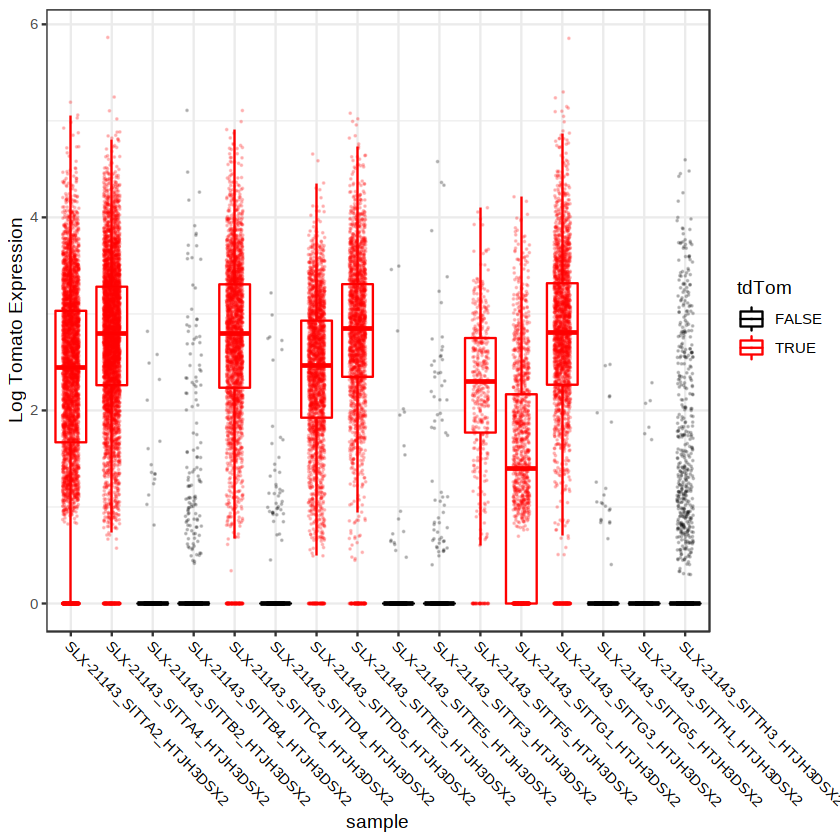

In [9]:
ggplot(test, aes(sample, tomato.td, col=tdTom)) + 
    geom_boxplot(outlier.shape = NA) +
    geom_point(position=position_jitter(width=0.2), size = 0.02, alpha = 0.2) +
    scale_color_manual(values=c('black', 'red')) +
    ylab('Log Tomato Expression') + 
    theme_bw() + theme(text = element_text(color='black'),
                       axis.text.x = element_text(angle=-45, hjust=0, color='black'))

In [9]:
# annotate any cell with tomato-td expression as being tdTom+
colData(sce)$tdTom_corr = ifelse(logcounts(sce['tomato-td',]) > 0 | colData(sce)$tdTom==TRUE, TRUE, FALSE)

# All cells

In [10]:
########################
## Create MILO object ##
########################

Milo_sce <- Milo(sce)

In [11]:
colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

In [12]:
# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       reduced.dim = "pca")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = 0.2, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "pca")

# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

Constructing kNN graph with k:30

Checking valid object

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Checking meta.data validity

Counting cells in neighbourhoods



In [171]:
# Save MILO object
outfile = sprintf("%s/processed/%s_Milo_features%d_pcs%d.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs)
saveRDS(Milo_sce, outfile)

In [13]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [14]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.6328522,9.904582,0.4044113,0.5248210,0.6823176,1,0.6733328
2,-0.6392184,10.102938,0.3874356,0.5336516,0.6870365,2,0.6784082
3,-0.5156648,9.228953,0.2863035,0.5926001,0.7204483,3,0.7124677
4,-1.2472920,9.416759,1.8234470,0.1769061,0.6320845,4,0.6204106
5,-0.8390925,9.765945,0.7659110,0.3814868,0.6364340,5,0.6248329
6,-1.4075778,9.438976,2.3249074,0.1273205,0.6320845,6,0.6204106


In [15]:
# Find Neighbourhood groups
da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

Found 66 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



In [16]:
# Annotate hoods by celltype
da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

# Annotate 'mixed' hoods when there is not one main celltype
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)

Converting celltype.mapped_mnn to factor...



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 30 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


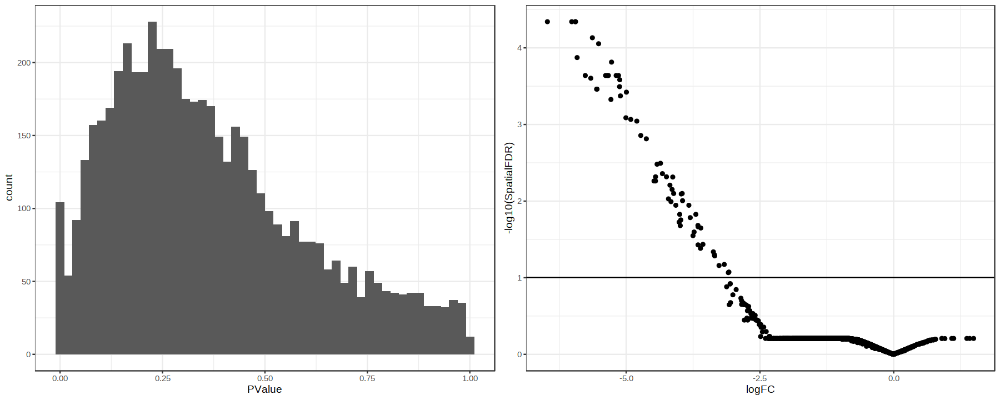

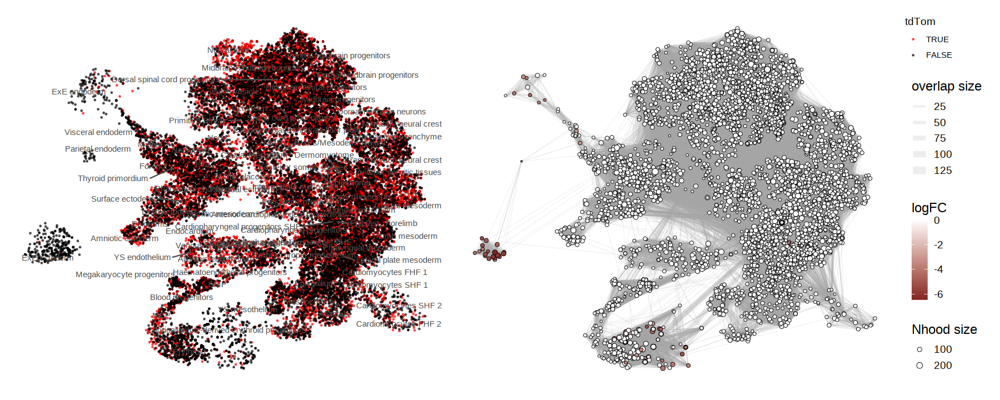

Converting group.by to factor...



In [ ]:
##################
## Plot results ##
##################

options(repr.plot.width=15, repr.plot.height=6)

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()

# Actually save this to PDF
ggarrange(p1, p2)


## Plot single-cell UMAP
umap_pl = plotReducedDim(Milo_sce, dimred = "umap_atlas", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30",) +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(Milo_sce, da_results, layout="umap_atlas",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Plot celltype fractions per hood
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + 
    geom_histogram(bins=50) + 
    theme_bw()

# plot DA beeswarm
options(repr.plot.width=15, repr.plot.height=10)
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,NhoodGroup,celltype.mapped_mnn,celltype.mapped_mnn_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
270,-6.228886,11.21516,31.20664,2.334359e-08,1.728159e-05,270,1.188498e-05,80,ExE ectoderm,1
789,-6.153967,11.16840,30.87151,2.773931e-08,1.728159e-05,789,1.188498e-05,80,ExE ectoderm,1
1458,-6.673998,11.50009,31.05209,2.527667e-08,1.728159e-05,1458,1.188498e-05,80,ExE ectoderm,1
116,-5.871195,11.40314,26.64268,2.459126e-07,7.660178e-05,116,5.438118e-05,80,ExE ectoderm,1
725,-5.305508,10.72023,27.24909,1.797272e-07,7.660178e-05,725,5.438118e-05,305,ExE ectoderm,1
1699,-5.794773,11.35554,26.65776,2.440031e-07,7.660178e-05,1699,5.438118e-05,80,ExE ectoderm,1


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 30 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


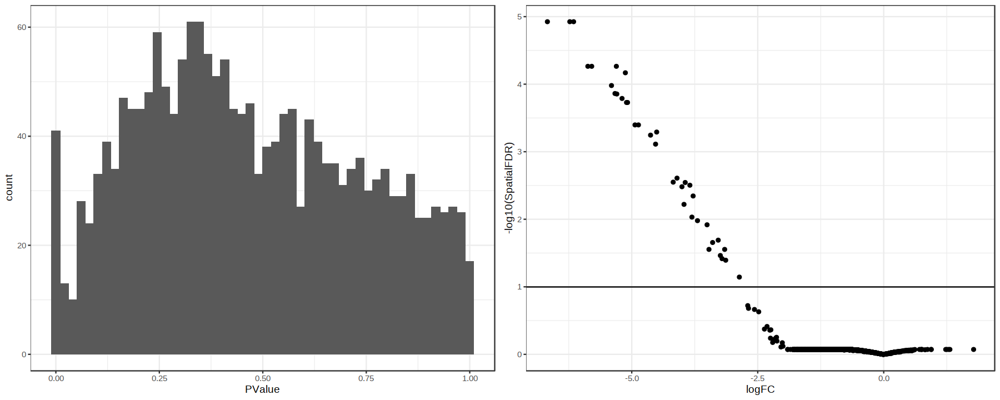

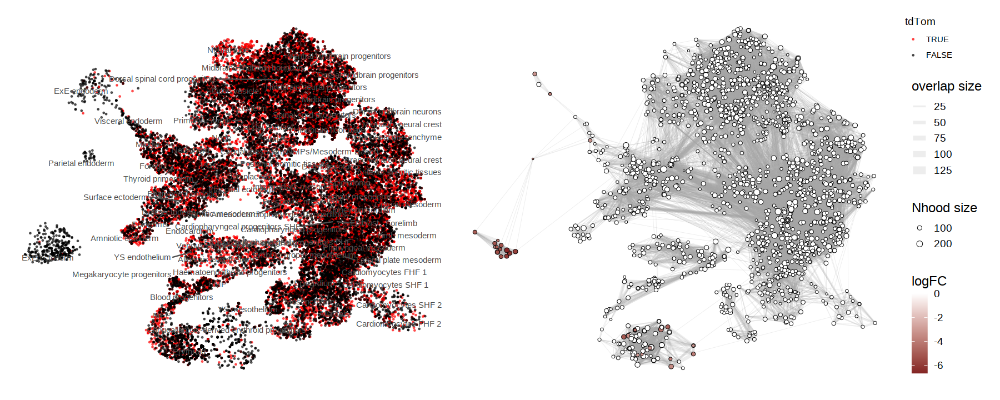

Converting group.by to factor...



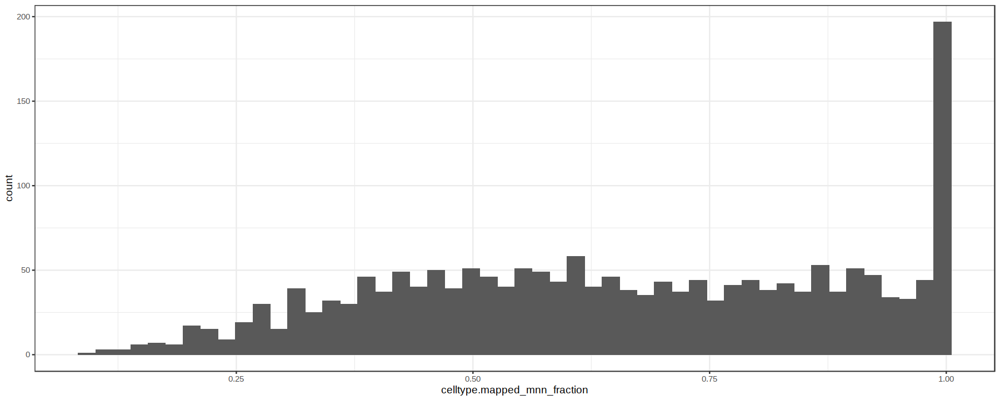

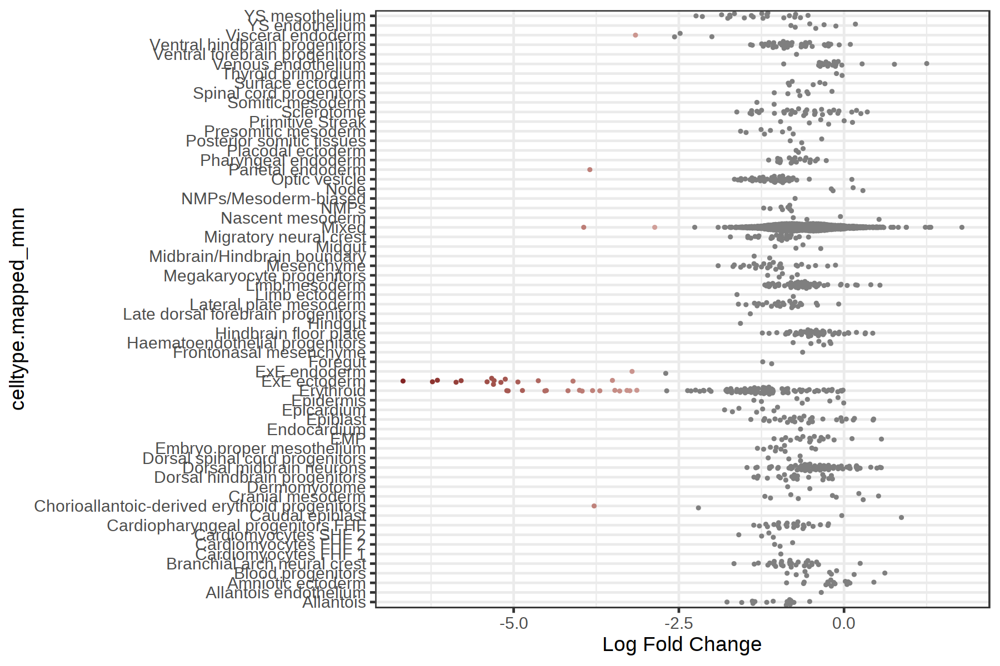

In [225]:
##################
## Plot results ##
##################

options(repr.plot.width=15, repr.plot.height=6)

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()

# Actually save this to PDF
ggarrange(p1, p2)


## Plot single-cell UMAP
umap_pl = plotReducedDim(Milo_sce, dimred = "umap_atlas", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30",) +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(Milo_sce, da_results, layout="umap_atlas",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Plot celltype fractions per hood
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + 
    geom_histogram(bins=50) + 
    theme_bw()

# plot DA beeswarm
options(repr.plot.width=15, repr.plot.height=10)
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

# E7.5

In [235]:
########################
## Create MILO object ##
########################

Milo_sce <- Milo(sce)
Milo_sce = Milo_sce[,colData(Milo_sce)$stage=='E7.5']

In [236]:
colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

In [237]:
# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       reduced.dim = "pca")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = 0.05, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "pca")

# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

Constructing kNN graph with k:30

Checking valid object

Checking meta.data validity

Counting cells in neighbourhoods



In [238]:
# Save MILO object
outfile = sprintf("%s/processed/%s_Milo_features%d_pcs%d.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs)
saveRDS(Milo_sce, outfile)

In [239]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [240]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.3991777,12.88139,0.19833746,0.6561657,0.9958637,1,0.9959446
2,-0.5297204,13.03148,0.33574665,0.5624295,0.9958637,2,0.9959446
3,-0.2245375,13.03447,0.05385181,0.8165405,0.9958637,3,0.9959446
4,-1.5896514,13.33507,2.47456361,0.1160283,0.9958637,4,0.9959446
5,0.7229408,12.81025,0.55170702,0.4578013,0.9958637,5,0.9959446
6,-0.1486042,12.78354,0.02696396,0.8696024,0.9958637,6,0.9959446


In [241]:
# Find Neighbourhood groups
da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

Found 16 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



In [242]:
# Annotate hoods by celltype
da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

# Annotate 'mixed' hoods when there is not one main celltype
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)

Converting celltype.mapped_mnn to factor...



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 14 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


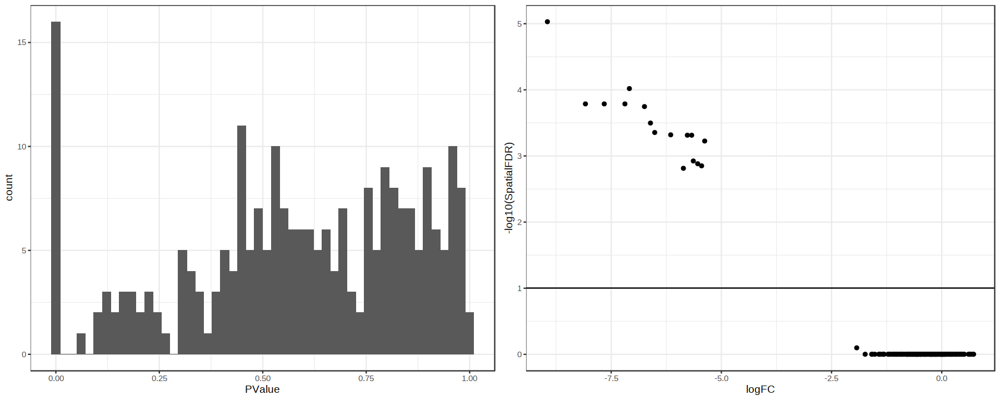

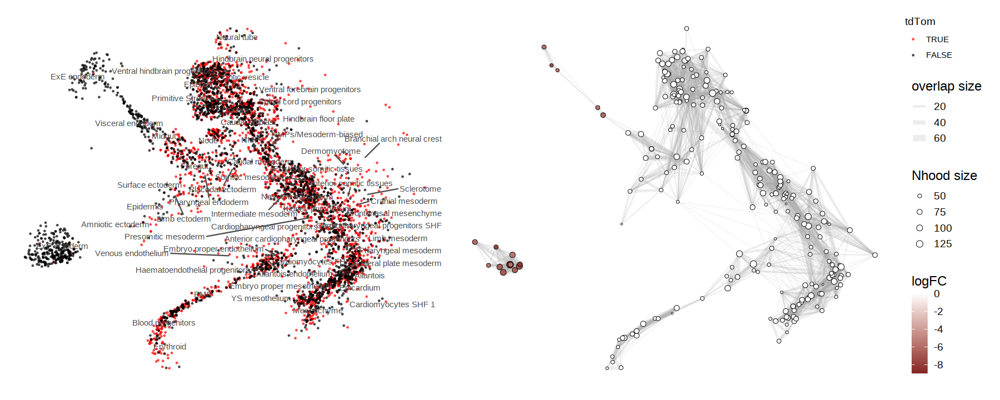

Converting group.by to factor...



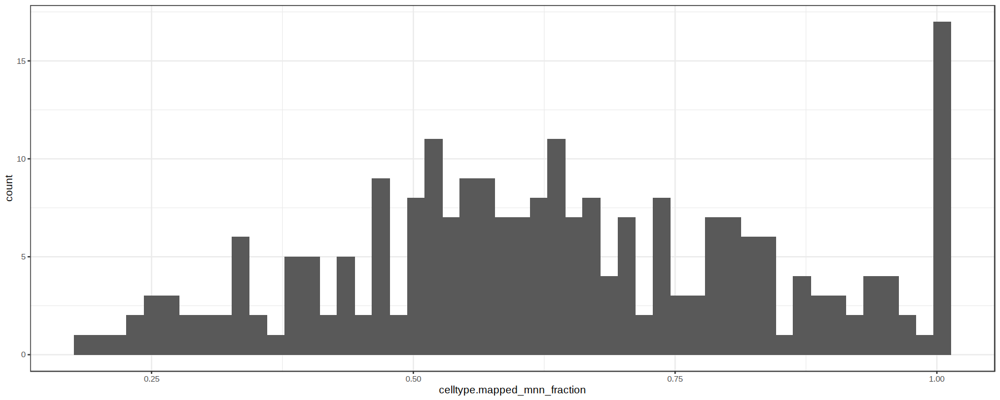

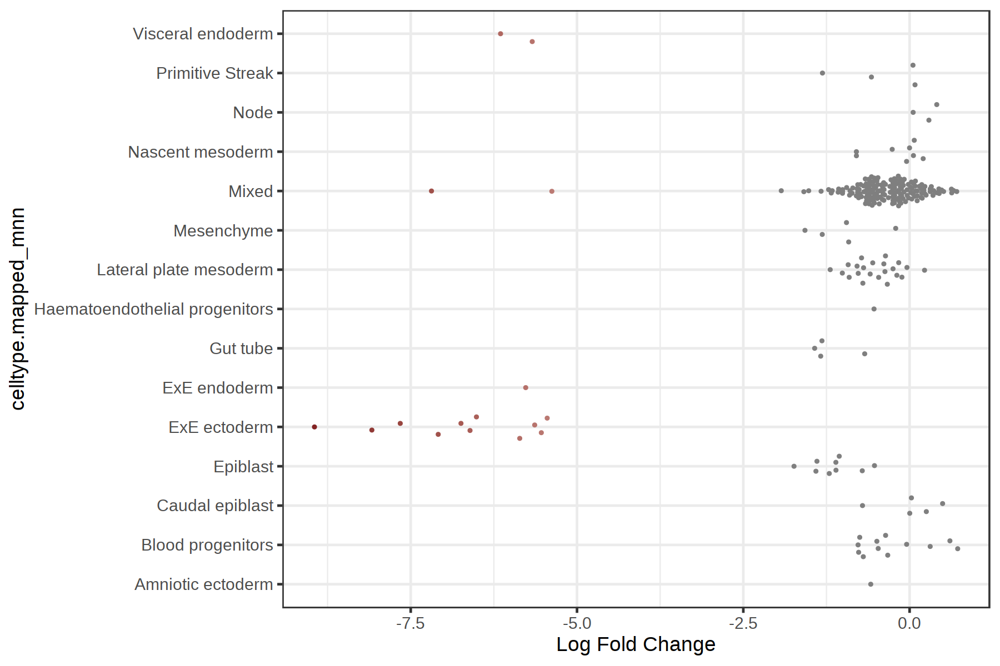

In [243]:
##################
## Plot results ##
##################

options(repr.plot.width=15, repr.plot.height=6)

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()

# Actually save this to PDF
ggarrange(p1, p2)


## Plot single-cell UMAP
umap_pl = plotReducedDim(Milo_sce, dimred = "umap_atlas", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30",) +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(Milo_sce, da_results, layout="umap_atlas",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Plot celltype fractions per hood
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + 
    geom_histogram(bins=50) + 
    theme_bw()

# plot DA beeswarm
options(repr.plot.width=15, repr.plot.height=10)
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

# E8.5

In [244]:
########################
## Create MILO object ##
########################

Milo_sce <- Milo(sce)
Milo_sce = Milo_sce[,colData(Milo_sce)$stage=='E8.5']

In [245]:
colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

In [246]:
# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       reduced.dim = "pca")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = 0.05, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "pca")

# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

Constructing kNN graph with k:30

Checking valid object

Checking meta.data validity

Counting cells in neighbourhoods



In [247]:
# Save MILO object
outfile = sprintf("%s/processed/%s_Milo_features%d_pcs%d.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs)
saveRDS(Milo_sce, outfile)

In [248]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [249]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.78425253,12.80339,0.974717333,0.3236220,0.9948947,1,0.9940369
2,0.14991395,12.66103,0.035875277,0.8497919,0.9948947,2,0.9940369
3,0.03026558,12.52764,0.001573517,0.9683620,0.9948947,3,0.9940369
4,-0.55421960,11.98293,0.499190498,0.4799356,0.9948947,4,0.9940369
5,0.21440990,12.46406,0.073002842,0.7870408,0.9948947,5,0.9940369
6,0.54024075,12.15738,0.442767547,0.5058639,0.9948947,6,0.9940369


In [250]:
# Find Neighbourhood groups
da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

Found 1 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



In [251]:
# Annotate hoods by celltype
da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

# Annotate 'mixed' hoods when there is not one main celltype
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)

Converting celltype.mapped_mnn to factor...



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 21 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


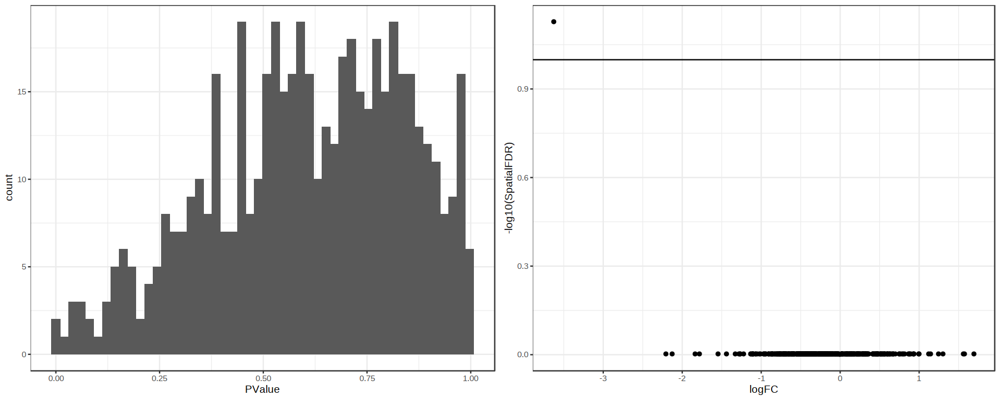

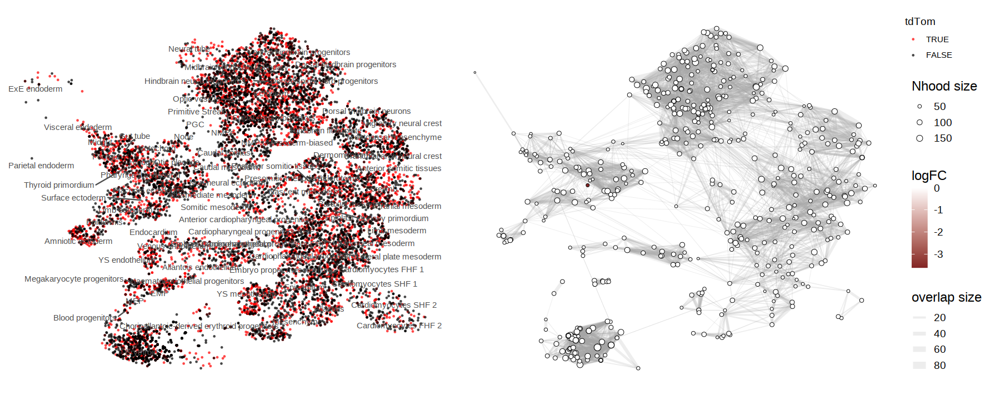

Converting group.by to factor...



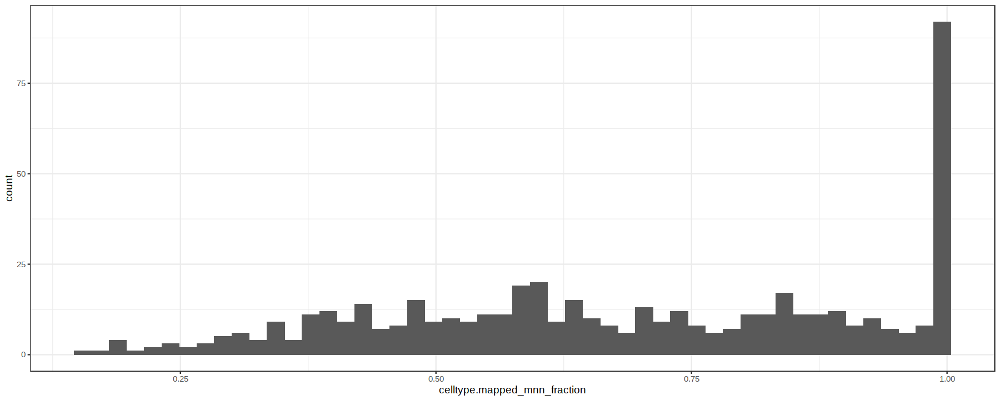

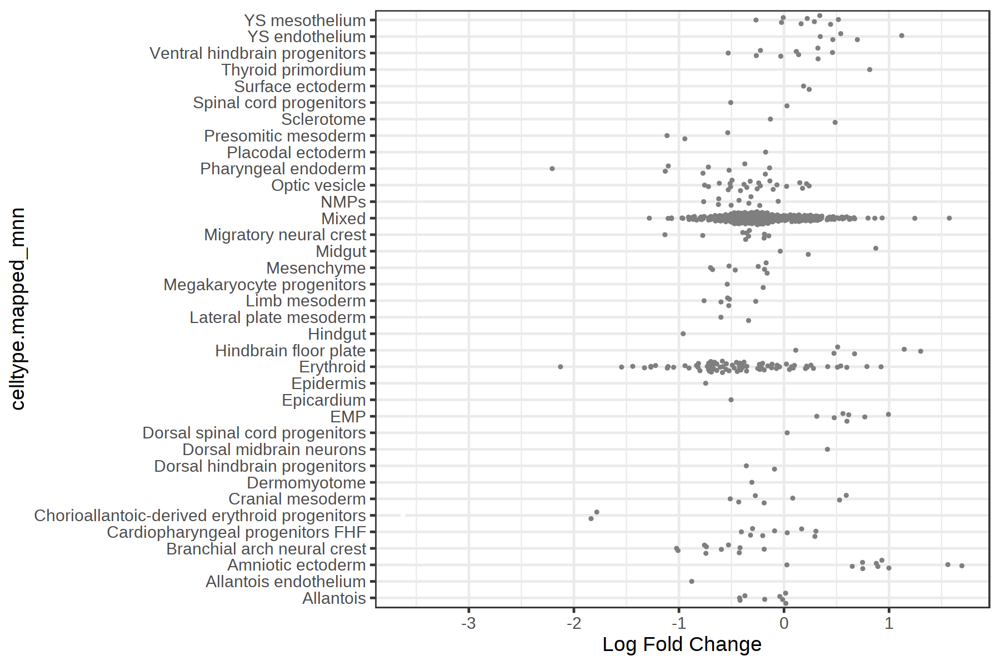

In [252]:
##################
## Plot results ##
##################

options(repr.plot.width=15, repr.plot.height=6)

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()

# Actually save this to PDF
ggarrange(p1, p2)


## Plot single-cell UMAP
umap_pl = plotReducedDim(Milo_sce, dimred = "umap_atlas", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30",) +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(Milo_sce, da_results, layout="umap_atlas",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Plot celltype fractions per hood
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + 
    geom_histogram(bins=50) + 
    theme_bw()

# plot DA beeswarm
options(repr.plot.width=15, repr.plot.height=10)
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

# E9.5

In [253]:
########################
## Create MILO object ##
########################

Milo_sce <- Milo(sce)
Milo_sce = Milo_sce[,colData(Milo_sce)$stage=='E9.5']

In [254]:
colData(Milo_sce)$sample_ko = paste0(colData(Milo_sce)$sample, '_',  colData(Milo_sce)$tdTom_corr)

In [262]:
# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       reduced.dim = "pca")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = 0.1, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "pca")

# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")

# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

Constructing kNN graph with k:30

Checking valid object

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Checking meta.data validity

Counting cells in neighbourhoods



In [263]:
# Save MILO object
outfile = sprintf("%s/processed/%s_Milo_features%d_pcs%d.rds",io$basedir, paste(args$stage, collapse ='_'), args$features, args$npcs)
saveRDS(Milo_sce, outfile)

In [264]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [265]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.4789817,9.754521,0.5459285,0.4599948,0.9988939,1,0.9984167
2,-0.8159972,9.638497,1.4873318,0.2226453,0.9988939,2,0.9984167
3,-0.3101900,9.856476,0.2213820,0.6379941,0.9988939,3,0.9984167
4,-0.5001115,10.092327,0.5828393,0.4452106,0.9988939,4,0.9984167
5,-1.8304514,9.609487,6.5435212,0.0105340,0.4200961,5,0.4110647
6,-0.8975218,10.084200,1.8761477,0.1707881,0.9988939,6,0.9984167


In [266]:
# Find Neighbourhood groups
da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

Found 37 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



In [267]:
# Annotate hoods by celltype
da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

# Annotate 'mixed' hoods when there is not one main celltype
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)

Converting celltype.mapped_mnn to factor...



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 29 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


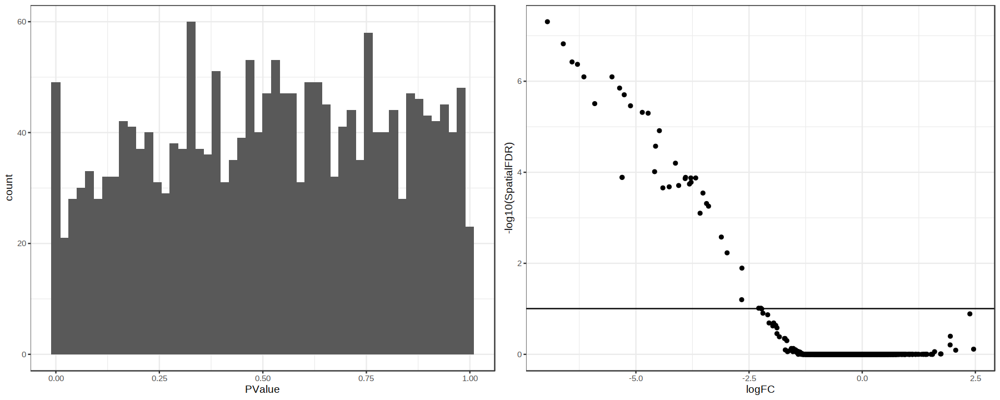

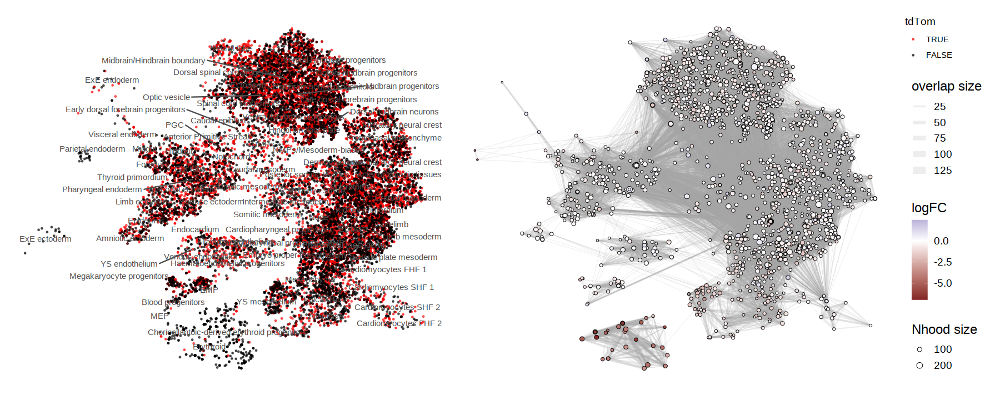

Converting group.by to factor...



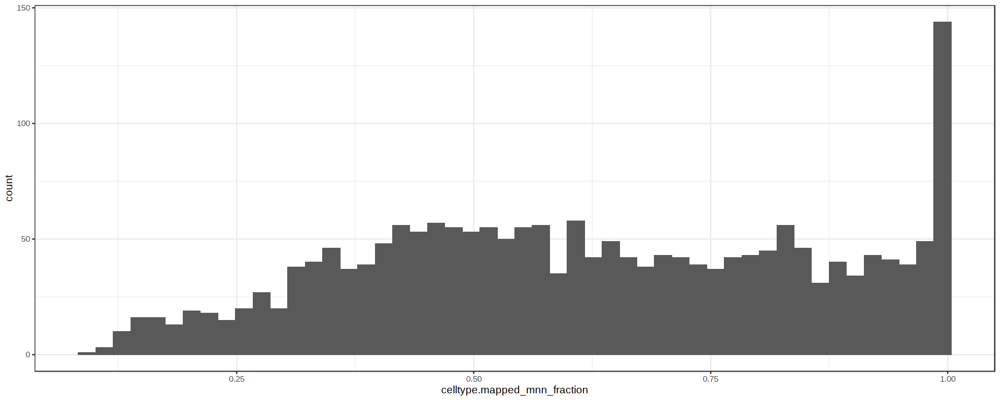

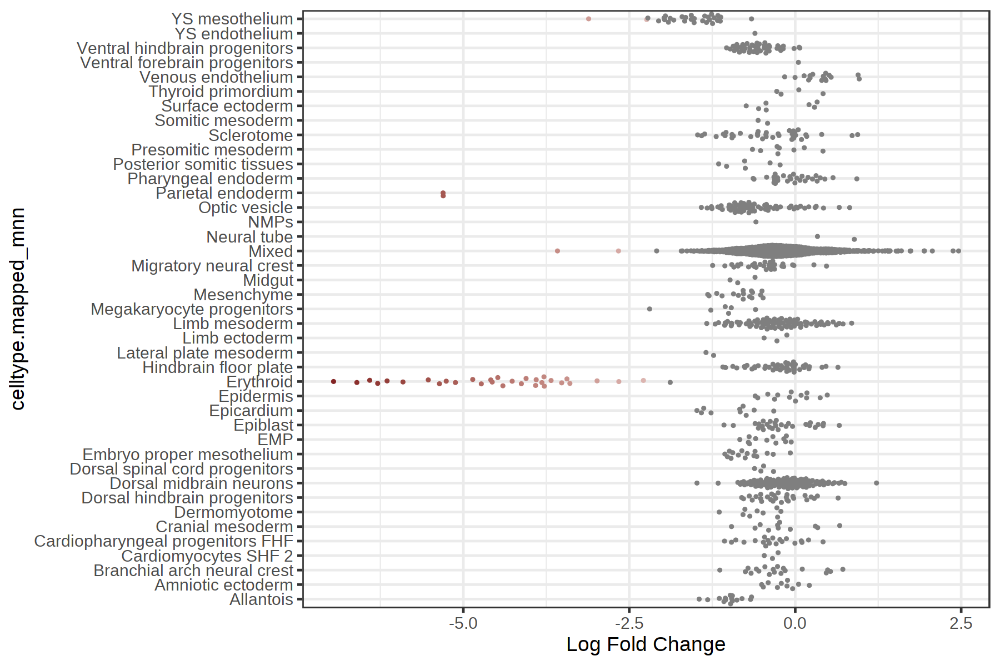

In [273]:
##################
## Plot results ##
##################

options(repr.plot.width=15, repr.plot.height=6)

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()

# Actually save this to PDF
ggarrange(p1, p2)


## Plot single-cell UMAP
umap_pl = plotReducedDim(Milo_sce, dimred = "umap_atlas", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30",) +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(Milo_sce, da_results, layout="umap_atlas",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Plot celltype fractions per hood
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + 
    geom_histogram(bins=50) + 
    theme_bw()

# plot DA beeswarm
options(repr.plot.width=15, repr.plot.height=10)
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

# DEG analysis

In [3]:
library(scater)

Loading required package: scuttle


Attaching package: ‘scater’


The following object is masked from ‘package:limma’:

    plotMDS




In [147]:
Milo_sce = readRDS("/rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/processed/E9.5_Milo_features2500_pcs50.rds")

In [148]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'stage')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [149]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



In [150]:
da_results = groupNhoods(Milo_sce, da_results, max.lfc.delta = 2, overlap = 7)
length(unique(da_results$NhoodGroup))

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

Found 41 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



[1] 29

Converting celltype.mapped_mnn to factor...



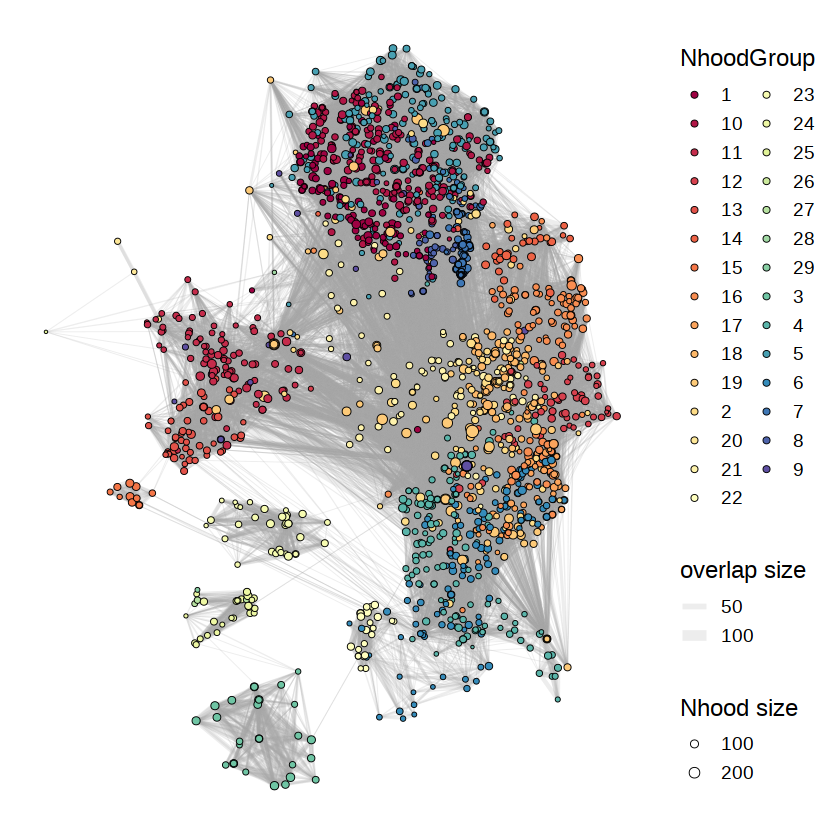

In [151]:
plotNhoodGroups(Milo_sce, da_results, layout="umap_atlas") 

Converting group.by to factor...



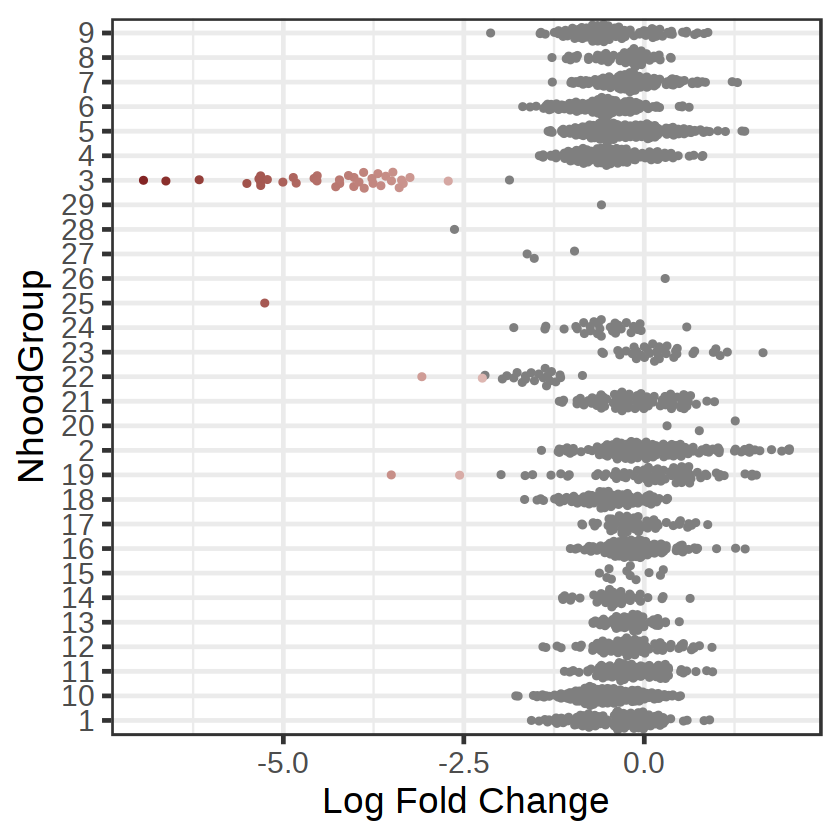

In [152]:
plotDAbeeswarm(da_results, group.by = "NhoodGroup")

In [153]:
DGE <- testDiffExp(Milo_sce, da_results, design=~tdTom_corr, meta.data = data.frame(colData(Milo_sce)))

Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warn

Coefficients not estimable: tdTom_corrTRUE 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More 

In [166]:
reoccuring = lapply(1:length(DGE), function(i){
    as.data.table(DGE[[i]], keep.rownames = TRUE) %>% 
    setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>0.8 & adj.P.Val<0.1] %>% 
    .[sig==TRUE] %>%
    .$gene})

In [167]:
drop = as.data.table(table(unlist(reoccuring))) %>% .[N>5, V1] 
drop 

[1] "Cwc22"     "Grb10"     "H19"       "Hba-a1"    "Hba-x"     "Hbb-bh1"  
 [7] "Hbb-y"     "Nnat"      "tomato-td" "Xist"

In [168]:
excl = rowSums(logcounts(Milo_sce))
excl = names(excl[excl == 0])
excl = c(excl, drop, 'Tsix')

In [169]:
p = list()
for(i in 1:length(DGE)){
to.plot = as.data.table(DGE[[i]], keep.rownames = TRUE) %>% setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>1 & adj.P.Val<0.01] %>% .[!gene%in% excl]
head(to.plot)

if(length(to.plot[sig==TRUE,]>0)){
p[[i]] = ggplot(to.plot, aes(logFC, -log10(adj.P.Val), col=sig)) + 
    geom_point(alpha=0.5) +
    scale_color_manual(values=opts$tdTom.color, name = 'Significant') +
    ggrepel::geom_text_repel(data=head(to.plot[sig==TRUE][order(-abs(logFC))],n=20), 
                             aes(x=logFC, y=-log10(adj.P.Val), label=gene),
                             max.overlaps=Inf, size=4) +
    geom_vline(xintercept = 0, linetype='dotted') + 
    theme_bw() + 
    ggtitle(paste0('NhoodGroup ', i), 
           paste(unique(as.data.table(da_results)[NhoodGroup==i & celltype.mapped_mnn_fraction>0.3] 
                        %>% .$celltype.mapped_mnn), collapse = ', ')) +
    theme(text = element_text(size = 20, color='black'))
    }
}

In [170]:
args$outdir <- file.path(io$basedir,"results/rna/plots")

In [171]:
outfile <- file.path(args$outdir,'E9.5_DEGs.pdf')
pdf(outfile, width=8, height=8)
 p
dev.off()

[[1]]
NULL

[[2]]

[[3]]

[[4]]
NULL

[[5]]
NULL

[[6]]
NULL

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]

[[13]]
NULL

[[14]]
NULL

[[15]]

[[16]]
NULL

[[17]]
NULL

[[18]]
NULL

[[19]]

[[20]]

[[21]]
NULL

[[22]]
NULL

[[23]]

[[24]]

[[25]]
NULL

[[26]]
NULL

[[27]]


png 
  2

In [172]:
Milo_sce = readRDS("/rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/processed/E8.5_Milo_features2500_pcs50.rds")

In [173]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'stage')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [174]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



In [175]:
#da_results = groupNhoods(Milo_sce, da_results, max.lfc.delta = 2, overlap = 10)
length(unique(da_results$NhoodGroup))

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")
#da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)

[1] 0

Converting celltype.mapped_mnn to factor...



In [176]:
head(da_results)

,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR,celltype.mapped_mnn,celltype.mapped_mnn_fraction
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
1,-1.1962539,11.56580,1.78303805,0.1818634,0.9989742,1,0.9990532,Limb mesoderm,0.2539683
2,-0.9493122,11.83754,1.07571543,0.2997296,0.9989742,2,0.9990532,Lateral plate mesoderm,0.9358974
3,-0.7856219,12.00800,0.71819615,0.3967941,0.9989742,3,0.9990532,Limb mesoderm,0.5632184
4,0.1003674,11.78283,0.01248568,0.9110365,0.9989742,4,0.9990532,Midgut,0.6956522
5,-0.6067243,12.06733,0.44439866,0.5050509,0.9989742,5,0.9990532,Surface ectoderm,0.5591398
6,-0.6811171,11.73464,0.57112656,0.4498624,0.9989742,6,0.9990532,Cranial mesoderm,0.5416667


In [177]:
da_results$NhoodGroup = da_results$celltype.mapped_mnn

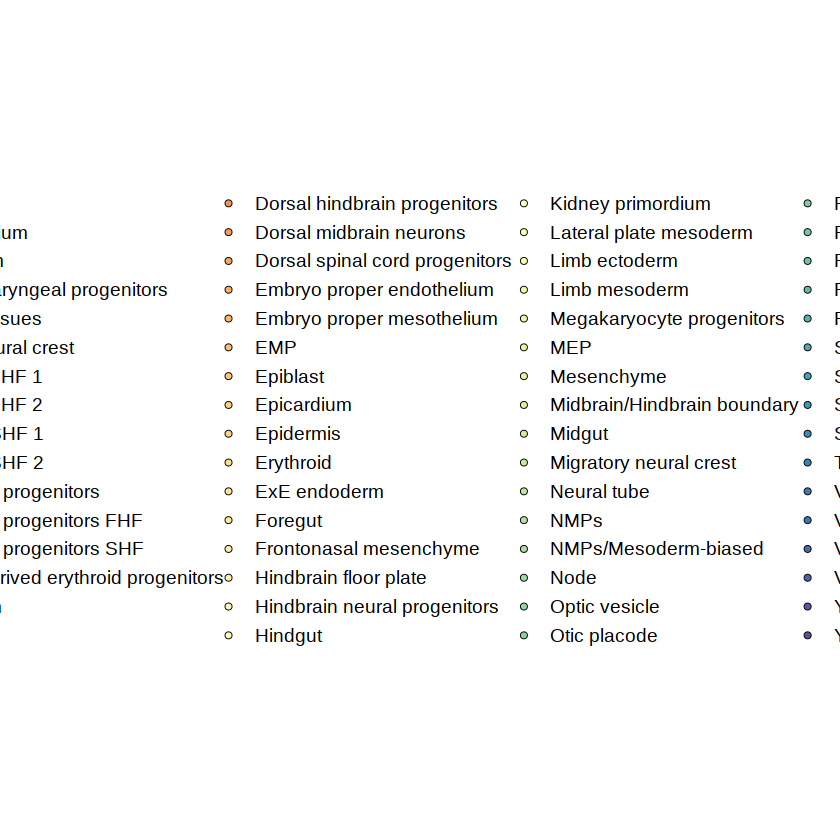

In [178]:
plotNhoodGroups(Milo_sce, da_results, layout="umap_atlas") 

In [179]:
#plotDAbeeswarm(da_results, group.by = "NhoodGroup")

In [180]:
DGE <- testDiffExp(Milo_sce, da_results, design=~tdTom_corr, meta.data = data.frame(colData(Milo_sce)))

Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual varia

In [181]:
reoccuring = lapply(1:length(DGE), function(i){
    as.data.table(DGE[[i]], keep.rownames = TRUE) %>% 
    setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>0.8 & adj.P.Val<0.1] %>% 
    .[sig==TRUE] %>%
    .$gene})

In [185]:
drop = as.data.table(table(unlist(reoccuring))) %>% .[N>5, V1] 
drop 

[1] "Gm10320"   "Gm42418"   "Grb10"     "H19"       "tomato-td"

In [189]:
excl = rowSums(logcounts(Milo_sce))
excl = names(excl[excl == 0])
excl = c(excl, drop, 'Tsix', 'Xist')

In [187]:
DGE =  rbindlist(
    lapply(DGE, function(x){
        x = as.data.table(x, keep.rownames = TRUE) %>% setnames('rn', 'gene')
    })
)

In [191]:
p = list()
for(i in unique(DGE$Nhood.Group)){
to.plot = DGE[Nhood.Group==i] %>%
    .[,sig:=abs(logFC)>1 & adj.P.Val<0.01] %>% .[!gene%in% excl]
head(to.plot)

if(length(to.plot[sig==TRUE,]>0)){
p[[i]] = ggplot(to.plot, aes(logFC, -log10(adj.P.Val), col=sig)) + 
    geom_point(alpha=0.5) +
    scale_color_manual(values=opts$tdTom.color, name = 'Significant') +
    ggrepel::geom_text_repel(data=head(to.plot[sig==TRUE][order(-abs(logFC))],n=20), 
                             aes(x=logFC, y=-log10(adj.P.Val), label=gene),
                             max.overlaps=Inf, size=4) +
    geom_vline(xintercept = 0, linetype='dotted') + 
    theme_bw() + 
    ggtitle(paste0(i)) +
    theme(text = element_text(size = 20, color='black'))
    }
}

In [192]:
args$outdir <- file.path(io$basedir,"results/rna/plots")

In [193]:
outfile <- file.path(args$outdir,'E8.5_DEGs.pdf')
pdf(outfile, width=8, height=8)
 p
dev.off()

$`Lateral plate mesoderm`

$`Cranial mesoderm`

$Erythroid

$`Amniotic ectoderm`

$Hindgut

$`Cardiopharyngeal progenitors SHF`

$`Chorioallantoic-derived erythroid progenitors`

$Allantois

$Dermomyotome

$Foregut

$`Spinal cord progenitors`

$`Megakaryocyte progenitors`

$EMP

$`YS mesothelium`

$`Placodal ectoderm`

$`Hindbrain neural progenitors`

$MEP

$`Visceral endoderm`

$`Thyroid primordium`

$`Embryo proper mesothelium`

$`Kidney primordium`

$`Limb ectoderm`

$`Frontonasal mesenchyme`


png 
  2

In [194]:
Milo_sce = readRDS("/rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/processed/E7.5_Milo_features2500_pcs50.rds")

In [195]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'stage')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [196]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



In [197]:
da_results = groupNhoods(Milo_sce, da_results, max.lfc.delta = 2, overlap = 7)
length(unique(da_results$NhoodGroup))

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

Found 32 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



[1] 12

Converting celltype.mapped_mnn to factor...



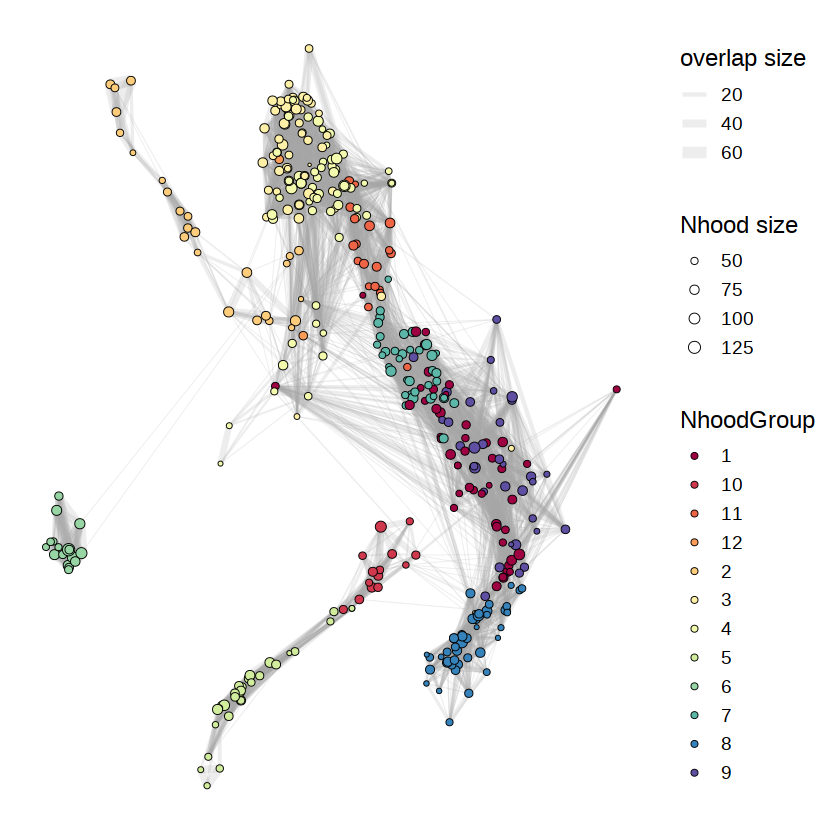

In [198]:
plotNhoodGroups(Milo_sce, da_results, layout="umap_atlas") 

Converting group.by to factor...



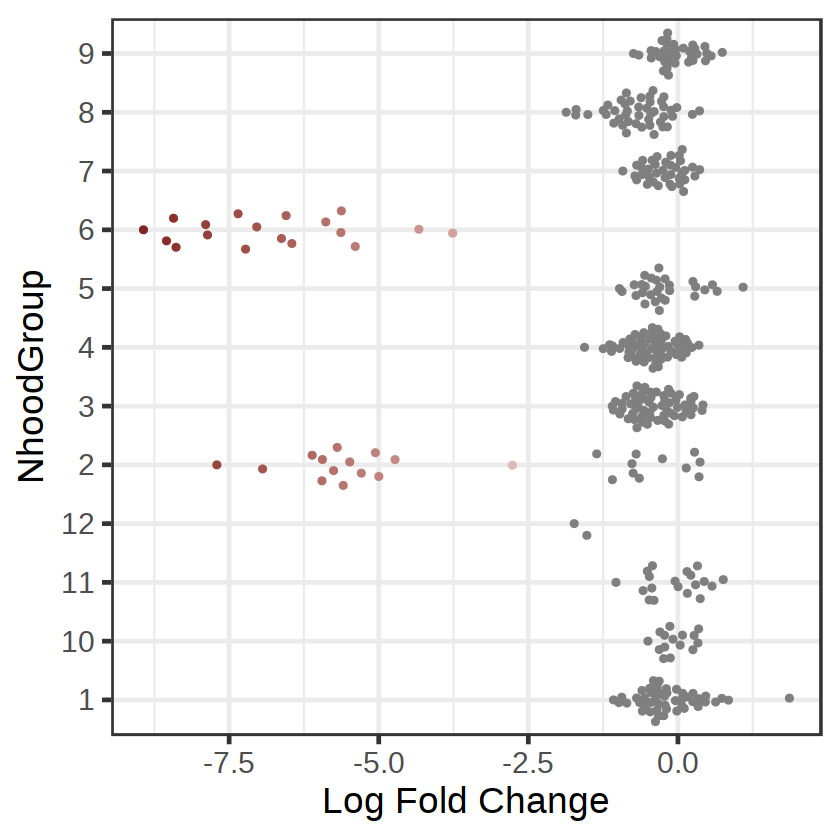

In [199]:
plotDAbeeswarm(da_results, group.by = "NhoodGroup")

In [200]:
DGE <- testDiffExp(Milo_sce, da_results, design=~tdTom_corr, meta.data = data.frame(colData(Milo_sce)))

Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of r

In [211]:
reoccuring = lapply(1:length(DGE), function(i){
    as.data.table(DGE[[i]], keep.rownames = TRUE) %>% 
    setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>0.8 & adj.P.Val<0.1] %>% 
    .[sig==TRUE] %>%
    .$gene})

In [212]:
drop = as.data.table(table(unlist(reoccuring))) %>% .[N>3, V1] 
drop 

[1] "Gm10031"   "Gns"       "Grb10"     "H19"       "Hist1h2ae" "Igf2"     
 [7] "Tmem14c"   "tomato-td" "Ubb"       "Xist"

In [204]:
excl = rowSums(logcounts(Milo_sce))
excl = names(excl[excl == 0])
excl = c(excl, drop, 'Tsix', 'Xist')

In [205]:
p = list()
for(i in 1:length(DGE)){
to.plot = as.data.table(DGE[[i]], keep.rownames = TRUE) %>% setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>1 & adj.P.Val<0.01] %>% .[!gene%in% excl]
head(to.plot)

if(length(to.plot[sig==TRUE,]>0)){
p[[i]] = ggplot(to.plot, aes(logFC, -log10(adj.P.Val), col=sig)) + 
    geom_point(alpha=0.5) +
    scale_color_manual(values=opts$tdTom.color, name = 'Significant') +
    ggrepel::geom_text_repel(data=head(to.plot[sig==TRUE][order(-abs(logFC))],n=20), 
                             aes(x=logFC, y=-log10(adj.P.Val), label=gene),
                             max.overlaps=Inf, size=4) +
    geom_vline(xintercept = 0, linetype='dotted') + 
    theme_bw() + 
    ggtitle(paste0('NhoodGroup ', i), 
           paste(unique(as.data.table(da_results)[NhoodGroup==i & celltype.mapped_mnn_fraction>0.3] 
                        %>% .$celltype.mapped_mnn), collapse = ', ')) +
    theme(text = element_text(size = 20, color='black'))
    }
}

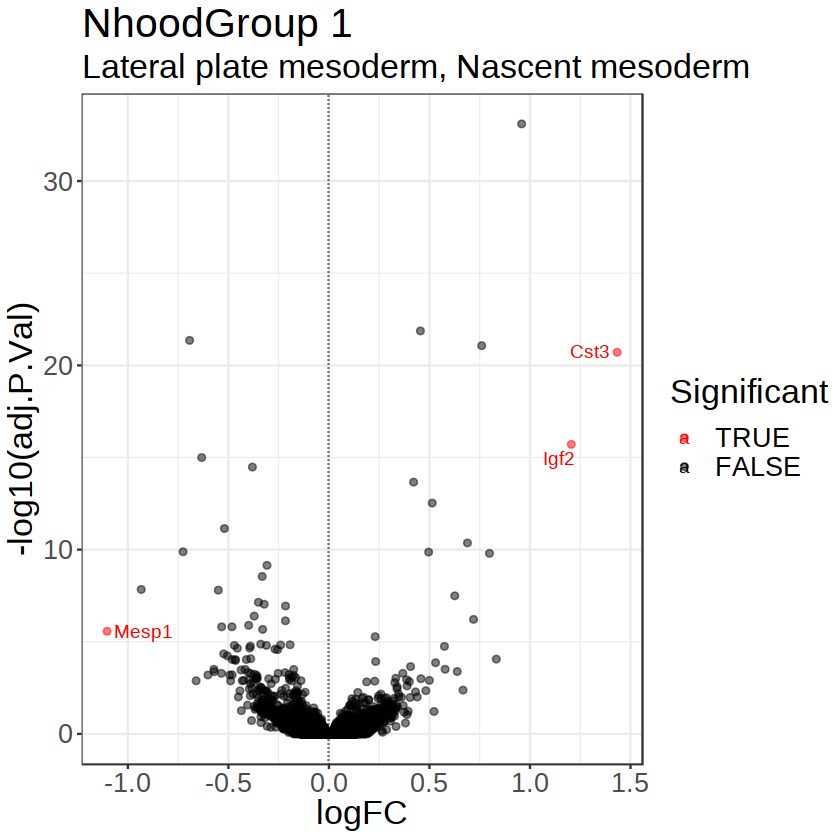

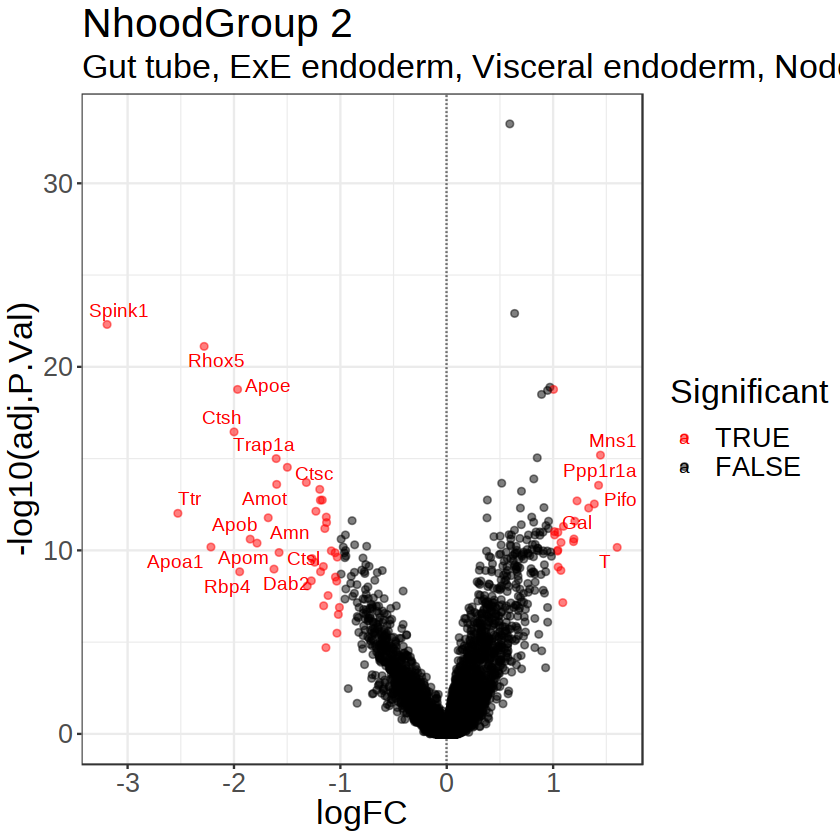

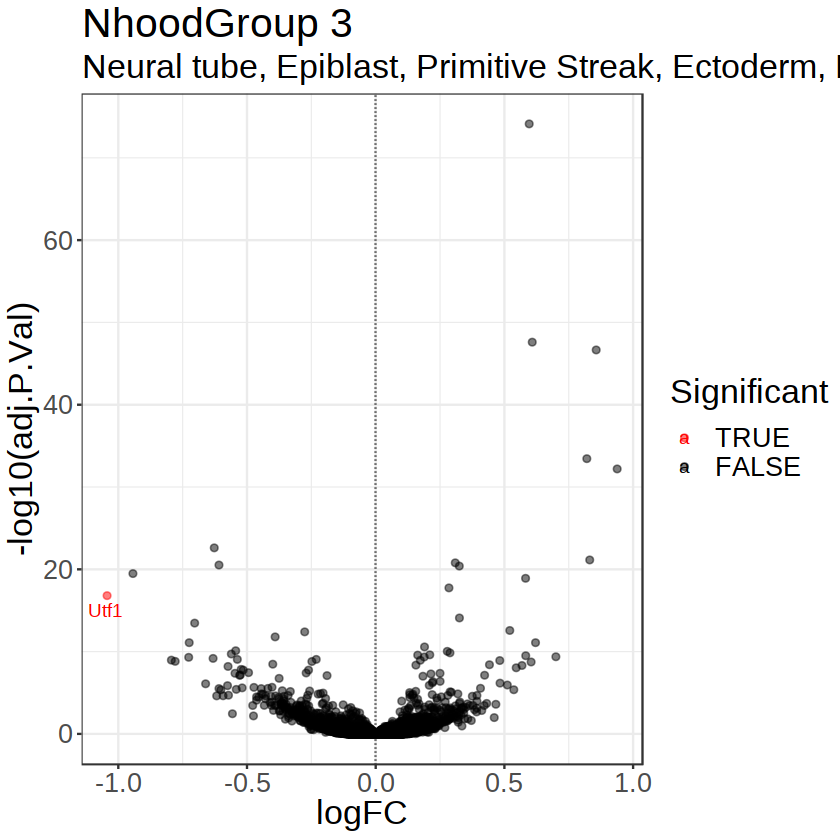

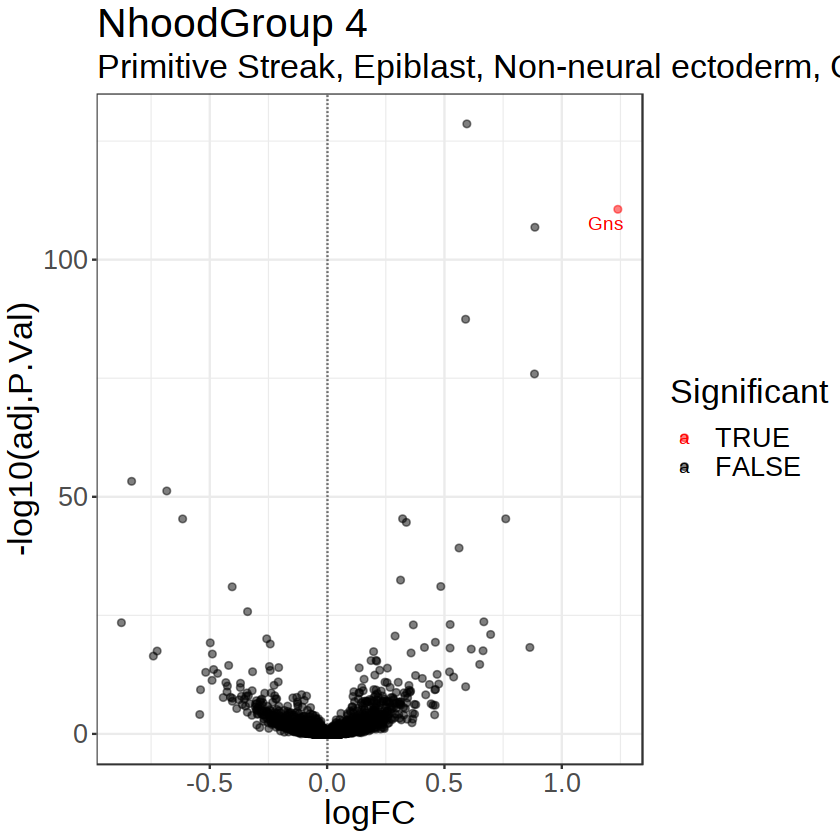

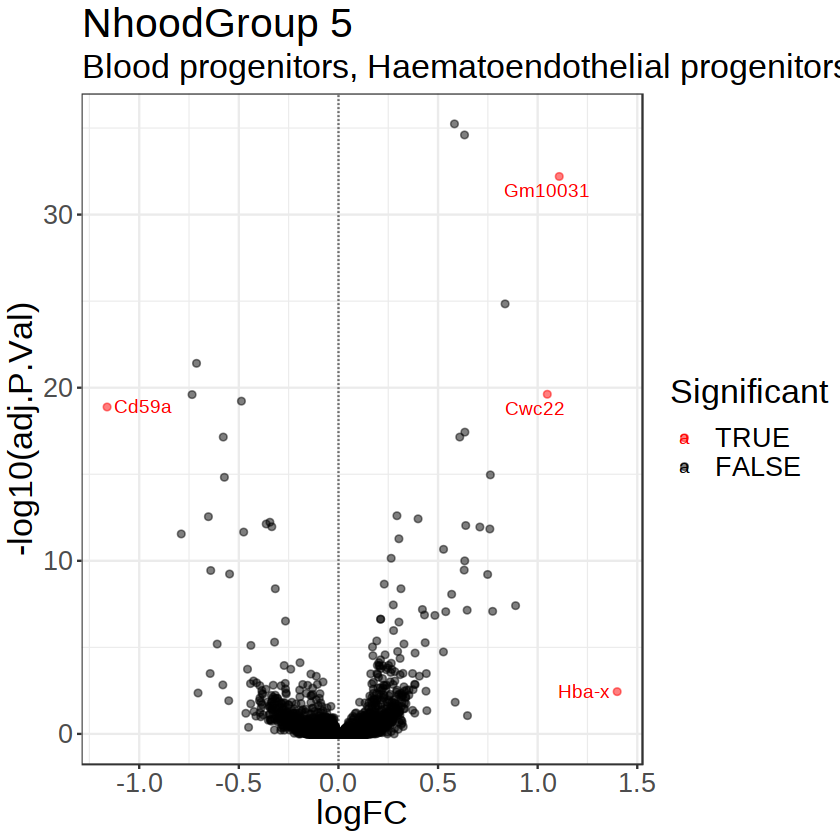

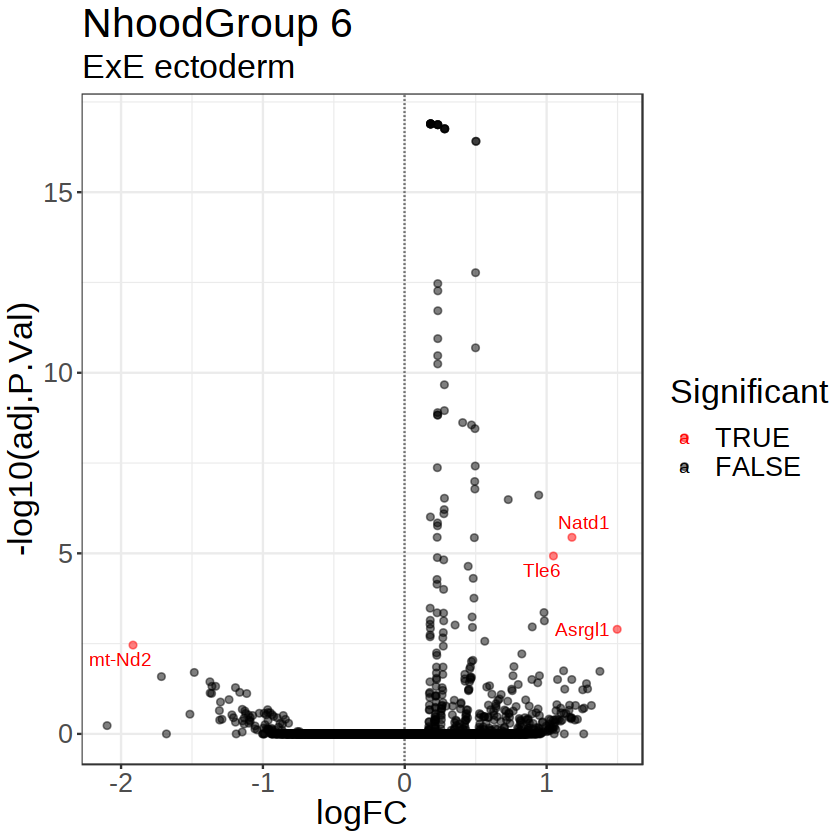

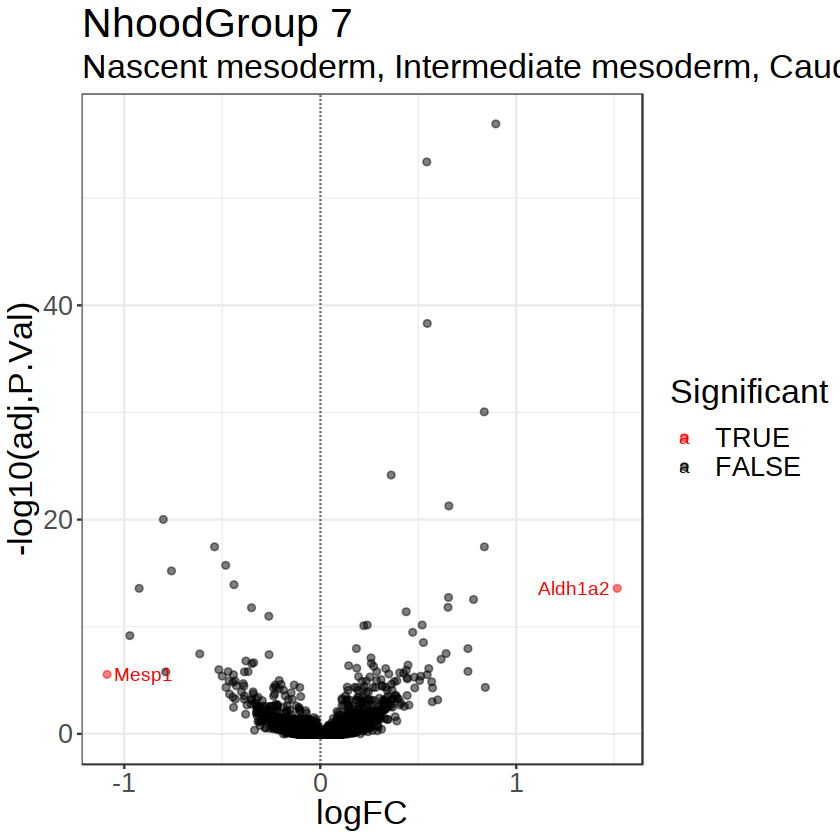

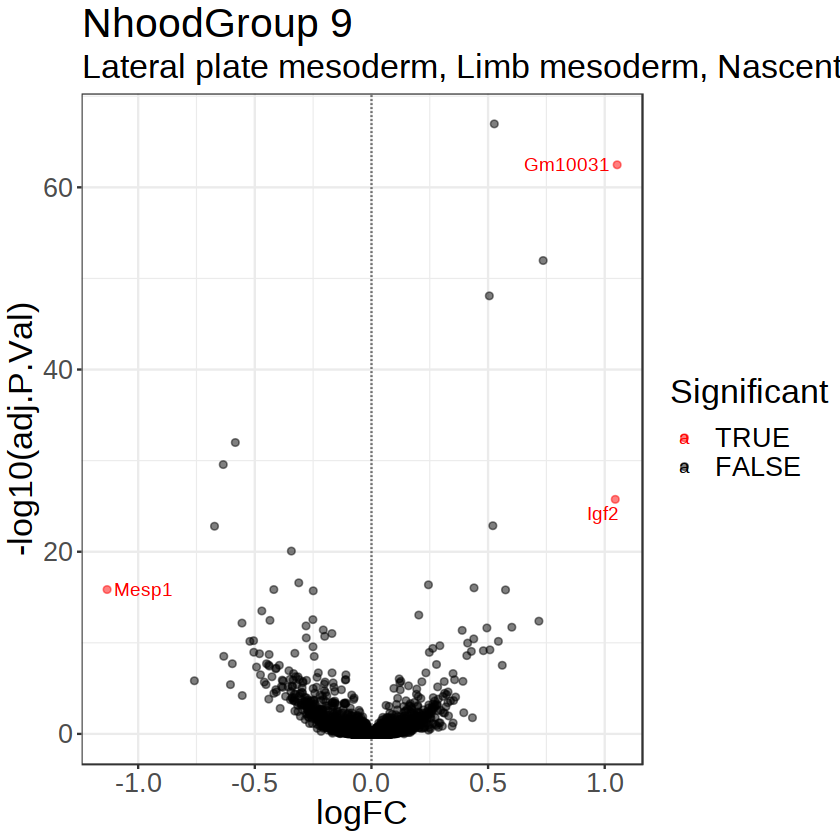

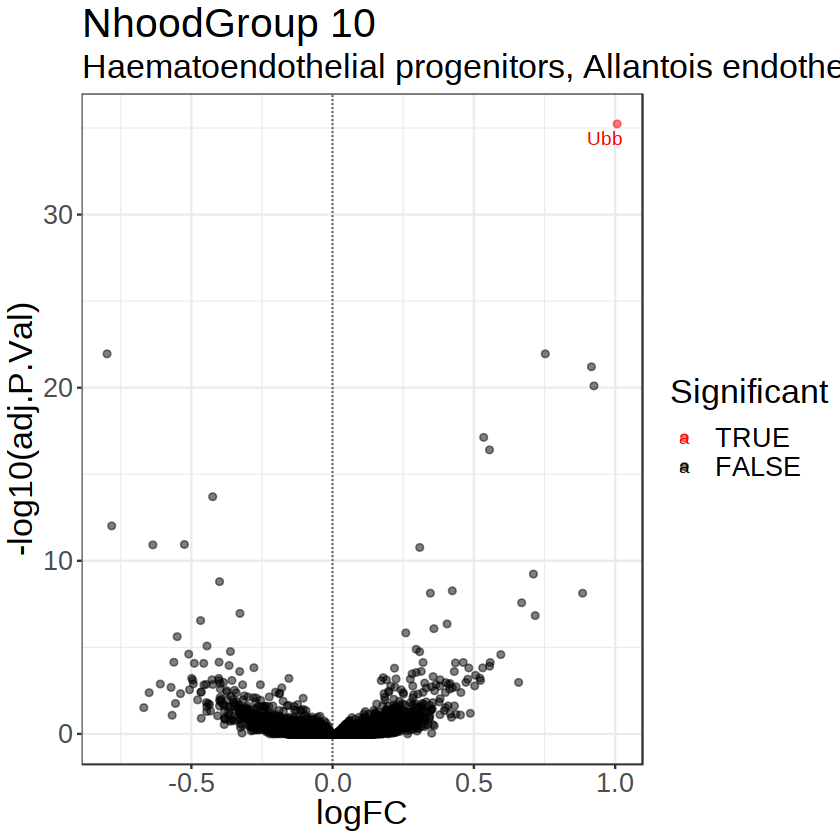

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]
NULL

[[9]]

[[10]]

[[11]]

[[12]]


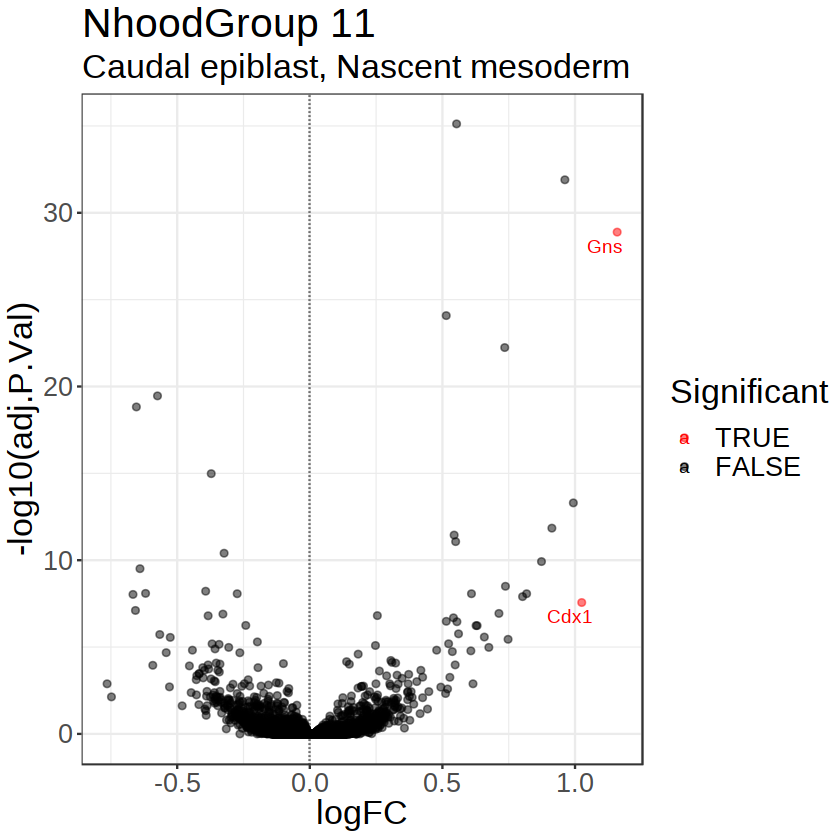

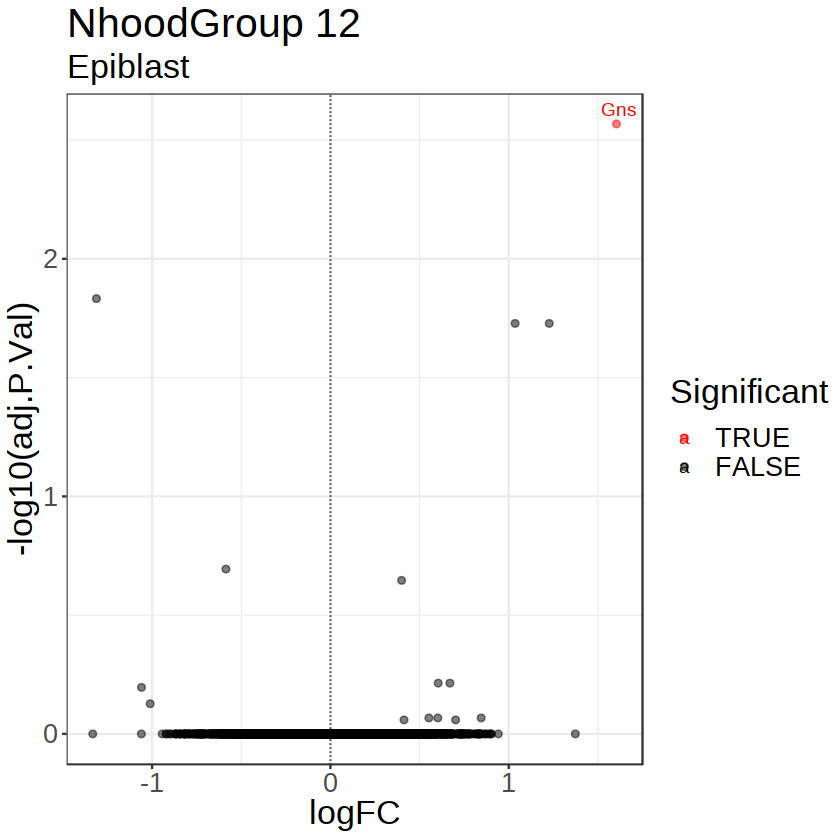

In [206]:
p

In [207]:
args$outdir <- file.path(io$basedir,"results/rna/plots")

In [208]:
outfile <- file.path(args$outdir,'E7.5_DEGs.pdf')
pdf(outfile, width=8, height=8)
 p
dev.off()

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]
NULL

[[9]]

[[10]]

[[11]]

[[12]]


png 
  2

In [634]:
Milo_sce = readRDS("/rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/processed/E7.5_E8.5_E9.5_Milo_features2500_pcs50.rds")

In [635]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'stage')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [644]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ stage + tdTom_corr, design.df = embryo_design, reduced.dim="pca")

Using TMM normalisation

Warning message in max(abs(logR)):
“no non-missing arguments to max; returning -Inf”
Performing spatial FDR correction withk-distance weighting



In [645]:
da_results = groupNhoods(Milo_sce, da_results, max.lfc.delta = 2, overlap = 7)
length(unique(da_results$NhoodGroup))

da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

Found 24 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



[1] 26

Converting celltype.mapped_mnn to factor...



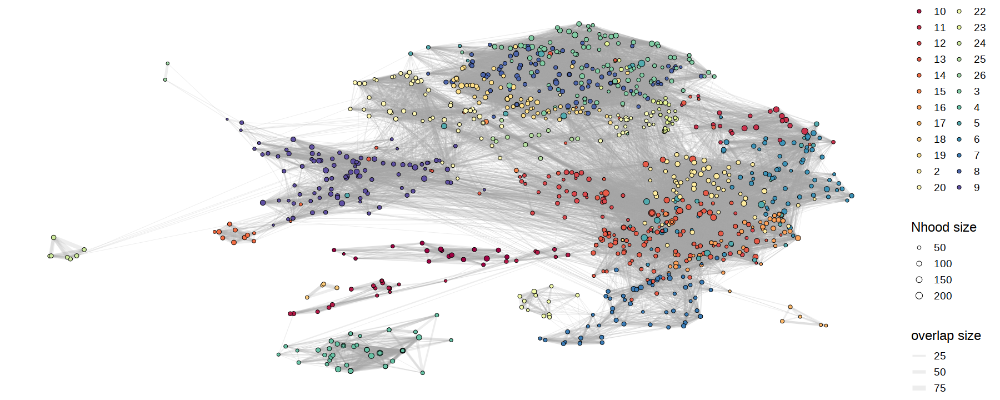

In [647]:
plotNhoodGroups(Milo_sce, da_results, layout="umap_atlas") 

Converting group.by to factor...



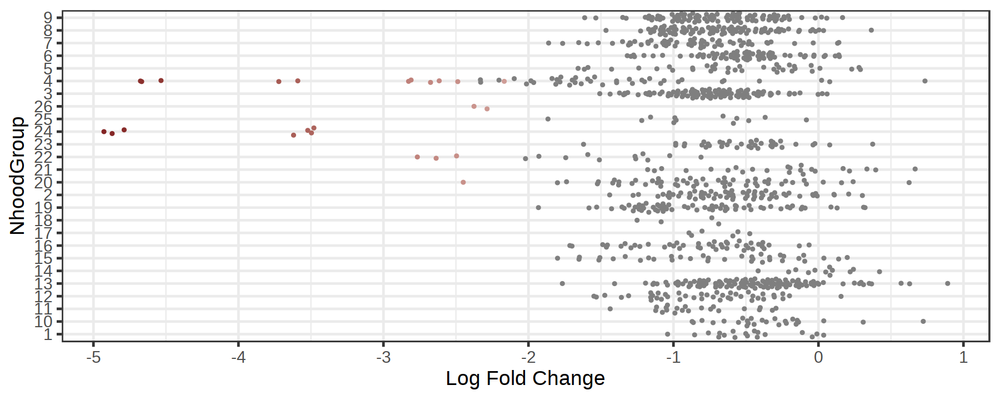

In [646]:
plotDAbeeswarm(da_results, group.by = "NhoodGroup")

In [648]:
DGE <- testDiffExp(Milo_sce, da_results, design=~stage+tdTom_corr, meta.data = data.frame(colData(Milo_sce)))

Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message:
“Zero sample variances detected, have been offset away from zero”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message:
“Zero sample variances detected, have been offset away from zero”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”


Coefficients not estimable: stageE9.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”


Coefficients not estimable: stageE8.5 


Warning message:
“Partial NA coefficients for 29453 probe(s)”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in out$var.prior[is.na(out$var.prior)] <- 1/out$s2.prior:
“number of items to replace is not a multiple of replacement length”
Warning message in .ebayes(fit = fit, proportion = proportion, stdev.coef.lim = stdev.coef.lim, :
“Estimation of var.prior failed - set to default value”
Warning message:
“Zero sample variances detected, have been offset away from zero”
Warning message in fitFDist(var, df1 = df, covariate = covariate):
“More than half of residual variances are exactly zero: eBayes unreliable”


In [650]:
reoccuring = lapply(1:length(DGE), function(i){
    as.data.table(DGE[[i]], keep.rownames = TRUE) %>% 
    setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>1 & -log10(adj.P.Val)>2] %>% 
    .[sig==TRUE] %>%
    .$gene})

In [651]:
drop = as.data.table(table(unlist(reoccuring))) %>% .[N>5, V1] 
drop 

[1] "Cwc22"     "Grb10"     "H19"       "Hba-x"     "Hbb-y"     "tomato-td"
[7] "Xist"

In [652]:
excl = rowSums(logcounts(Milo_sce))
excl = names(excl[excl == 0])
excl = c(excl, drop, 'Tsix')

In [653]:
p = list()
for(i in 1:length(DGE)){
to.plot = as.data.table(DGE[[i]], keep.rownames = TRUE) %>% setnames('rn', 'gene') %>%
    .[,sig:=abs(logFC)>1 & -log10(adj.P.Val)>3] %>% .[!gene%in% excl]
head(to.plot)

if(length(to.plot[sig==TRUE,]>0)){
p[[i]] = ggplot(to.plot, aes(logFC, -log10(adj.P.Val), col=sig)) + 
    geom_point(alpha=0.5) +
    scale_color_manual(values=opts$tdTom.color, name = 'Significant') +
    ggrepel::geom_text_repel(data=head(to.plot[sig==TRUE],n=20), 
                             aes(x=logFC, y=-log10(adj.P.Val), label=gene),
                             max.overlaps=Inf, size=4) +
    geom_vline(xintercept = 0, linetype='dotted') + 
    theme_bw() + 
    ggtitle(paste0('NhoodGroup ', i), 
           paste(unique(as.data.table(da_results)[NhoodGroup==i & celltype.mapped_mnn_fraction>0.3] 
                        %>% .$celltype.mapped_mnn), collapse = ', ')) +
    theme(text = element_text(size = 20, color='black'))
    }
}

In [654]:
args$outdir <- file.path(io$basedir,"results/rna/plots")

In [655]:
outfile <- file.path(args$outdir,'E7.5_E8.5_E9.5_DEGs.pdf')
pdf(outfile, width=8, height=8)
 p
dev.off()

[[1]]
NULL

[[2]]
NULL

[[3]]
NULL

[[4]]

[[5]]

[[6]]

[[7]]
NULL

[[8]]
NULL

[[9]]
NULL

[[10]]
NULL

[[11]]
NULL

[[12]]
NULL

[[13]]
NULL

[[14]]
NULL

[[15]]
NULL

[[16]]
NULL

[[17]]
NULL

[[18]]

[[19]]
NULL

[[20]]
NULL

[[21]]
NULL

[[22]]
NULL

[[23]]
NULL

[[24]]


png 
  2

In [213]:
Milo_sce = readRDS("/rds/project/rds-SDzz0CATGms/users/bt392/03_Stat3_RNA/processed/E9.5_Milo_features2500_pcs50.rds")

In [214]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom', 'stage')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [215]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



In [216]:
da_results$NhoodGroup = 1

In [217]:
DGE <- testDiffExp(Milo_sce, da_results, design=~tdTom_corr, meta.data = data.frame(colData(Milo_sce)))

Warning message:
“Zero sample variances detected, have been offset away from zero”


In [220]:
p = list()
for(i in 1:length(DGE)){
to.plot = as.data.table(DGE[[i]], keep.rownames = TRUE) %>% setnames('rn', 'gene') %>%
        .[,sig:=abs(logFC)>0.8 & adj.P.Val<0.1]
head(to.plot)

if(length(to.plot[sig==TRUE,]>0)){
p[[i]] = ggplot(to.plot, aes(logFC, -log10(adj.P.Val), col=sig)) + 
    geom_point(alpha=0.5) +
    scale_color_manual(values=opts$tdTom.color, name = 'Significant') +
    ggrepel::geom_text_repel(data=head(to.plot[sig==TRUE],n=20), 
                             aes(x=logFC, y=-log10(adj.P.Val), label=gene),
                             max.overlaps=Inf, size=4) +
    geom_vline(xintercept = 0, linetype='dotted') + 
    theme_bw() + 
    ggtitle(paste0('NhoodGroup ', i)) +
    theme(text = element_text(size = 20, color='black'))
    }
}

In [222]:
to.plot = as.data.table(DGE[[i]], keep.rownames = TRUE) %>% setnames('rn', 'gene') %>%
        .[,sig:=abs(logFC)>0.8 & adj.P.Val<0.1] %>% .[sig==TRUE]

[[1]]


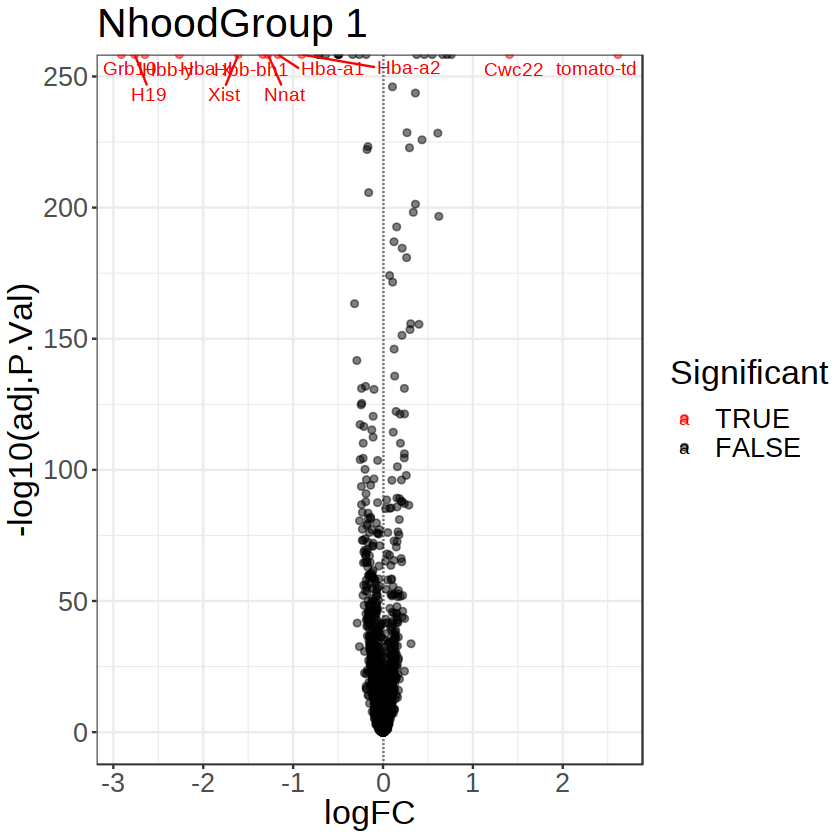

In [224]:
p

# Higher prop

In [13]:
# Build graph
Milo_sce <- buildGraph(Milo_sce, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       reduced.dim = "pca")

# Identify neighbourhoods from NN-cells
# lower prop for larger datasets
Milo_sce <- makeNhoods(Milo_sce, 
                       prop = 0.2, 
                       k = args$nneighbours, 
                       d = args$npcs, 
                       refined = TRUE, 
                       reduced_dims = "pca")

# count cells of different samples per neighbourhood
Milo_sce <- countCells(Milo_sce, meta.data = as.data.frame(colData(Milo_sce)), sample="sample_ko")


Constructing kNN graph with k:30

Checking valid object

Warning message in (function (to_check, X, clust_centers, clust_info, dtype, nn, :
“detected tied distances to neighbors, see ?'BiocNeighbors-ties'”
Checking meta.data validity

Counting cells in neighbourhoods



In [18]:
# Calculate Neighbourhood Distances (most time consuming step)
Milo_sce <- calcNhoodDistance(Milo_sce, d=args$npcs, reduced.dim = "pca")

# Build neighbourhood graph
Milo_sce <- buildNhoodGraph(Milo_sce)

In [19]:
# Embryo design table
embryo_design <- data.frame(colData(Milo_sce))[,c("sample_ko", "sample", 'tdTom_corr', 'tdTom')]

embryo_design <- distinct(embryo_design)
rownames(embryo_design) <- embryo_design$sample_ko

In [20]:
# Test differential abundance per hood
# design = what to test for, can correct for another variable as well
da_results <- testNhoods(Milo_sce, design = ~ tdTom_corr, design.df = embryo_design, reduced.dim="pca")
head(da_results)

Using TMM normalisation

Performing spatial FDR correction withk-distance weighting



,logFC,logCPM,F,PValue,FDR,Nhood,SpatialFDR
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-2.1199528,9.642875,5.24609032,0.02199791,0.8552068,1,0.8362214
2,-0.8111261,9.383396,0.81271575,0.36732041,0.8552068,2,0.8362214
3,-1.1084661,9.547430,1.43471618,0.23099872,0.8552068,3,0.8362214
4,-0.1342939,9.391928,0.01970906,0.88835292,0.9600236,4,0.9554644
5,-1.0355353,10.235816,0.98198391,0.32171155,0.8552068,5,0.8362214
6,-0.7788658,10.168841,0.57378434,0.44876055,0.8552068,6,0.8362214


In [21]:
# Find Neighbourhood groups
da_results <- groupNhoods(Milo_sce, da_results, max.lfc.delta = 0.5, overlap = 20)

Found 80 DA neighbourhoods at FDR 10%

nhoodAdjacency found - using for nhood grouping



In [22]:
# Annotate hoods by celltype
da_results <- annotateNhoods(Milo_sce, da_results, coldata_col = "celltype.mapped_mnn")

# Annotate 'mixed' hoods when there is not one main celltype
da_results$celltype.mapped_mnn <- ifelse(da_results$celltype.mapped_mnn_fraction < 0.7, "Mixed", da_results$celltype.mapped_mnn)

Converting celltype.mapped_mnn to factor...



Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Warning message:
“ggrepel: 30 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


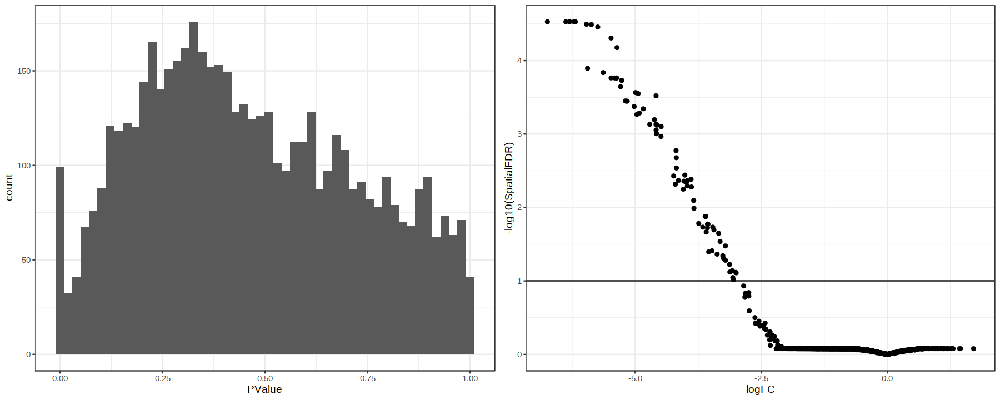

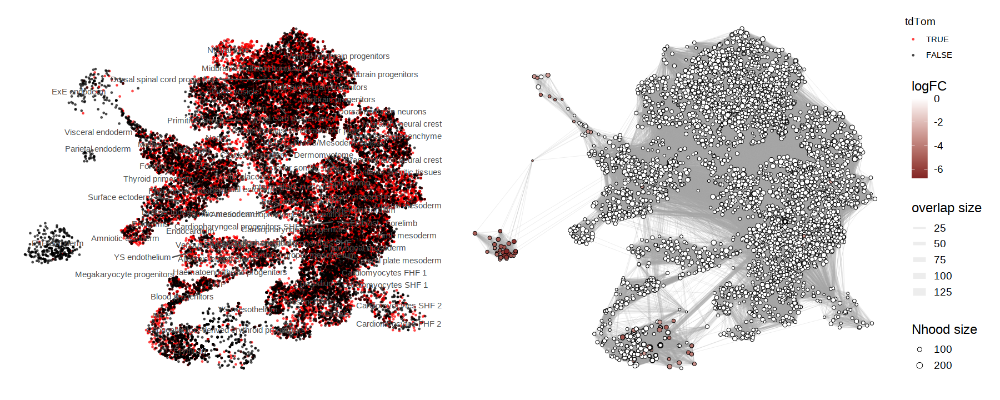

Converting group.by to factor...



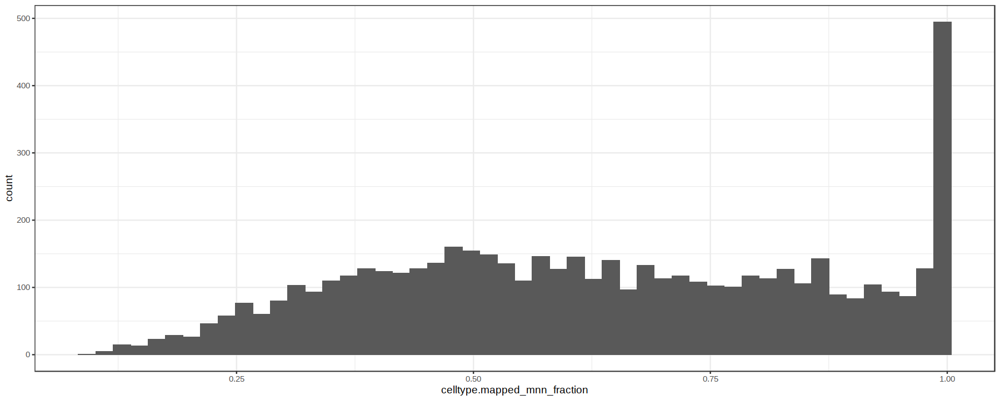

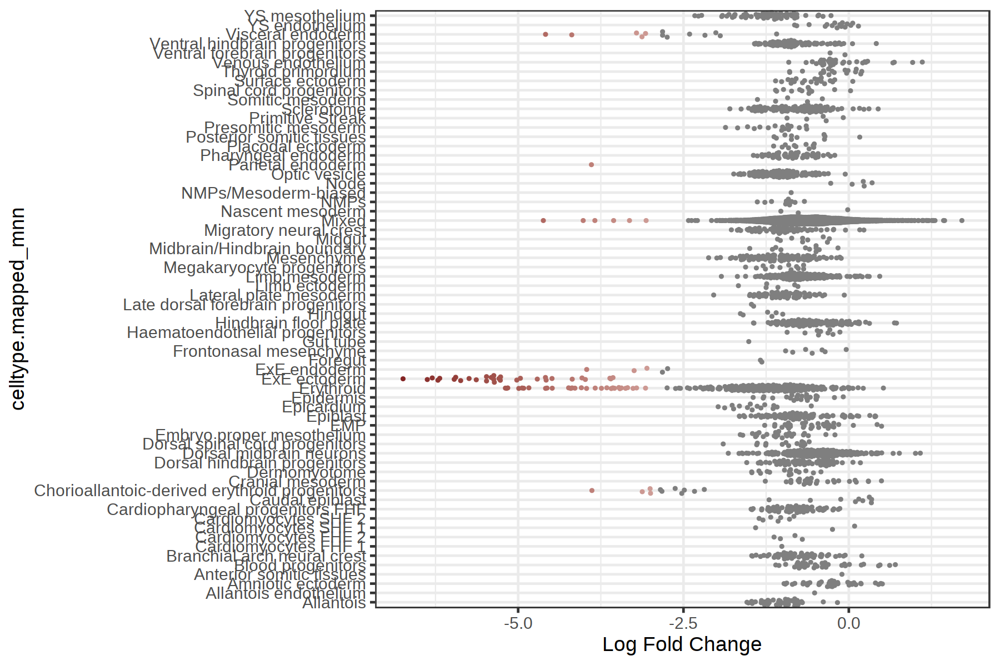

In [23]:
##################
## Plot results ##
##################

options(repr.plot.width=15, repr.plot.height=6)

p1 = ggplot(da_results, aes(PValue)) + 
    geom_histogram(bins=50) + 
    theme_bw()

p2 = ggplot(da_results, aes(logFC, -log10(SpatialFDR))) + 
    geom_point() +
    geom_hline(yintercept = 1) + ## Mark significance threshold (10% FDR)
    theme_bw()

# Actually save this to PDF
ggarrange(p1, p2)


## Plot single-cell UMAP
umap_pl = plotReducedDim(Milo_sce, dimred = "umap_atlas", colour_by="tdTom_corr", text_by = "celltype.mapped_mnn", 
                          text_size = 3, point_size=0.3, text_colour = "grey30",) +
    scale_color_manual(values=opts$tdTom.color, name = 'tdTom') + 
    theme_void() + 
    theme(legend.position='right') +
    guides(fill="none")

## Plot neighbourhood graph
nh_graph_pl <- plotNhoodGraphDA(Milo_sce, da_results, layout="umap_atlas",alpha=0.1) 
  
umap_pl + nh_graph_pl +
  plot_layout(guides="collect")

# Plot celltype fractions per hood
ggplot(da_results, aes(celltype.mapped_mnn_fraction)) + 
    geom_histogram(bins=50) + 
    theme_bw()

# plot DA beeswarm
options(repr.plot.width=15, repr.plot.height=10)
plotDAbeeswarm(da_results, group.by = "celltype.mapped_mnn")

# Plot UMAPs

In [252]:
meta = colData(Milo_sce)[c('closest.cell_mnn', 'celltype.mapped_mnn', 'stage', 'celltype.score_mnn')]
umap = reducedDims(Milo_sce)[['umap']]
meta = merge(meta, umap, by=0)

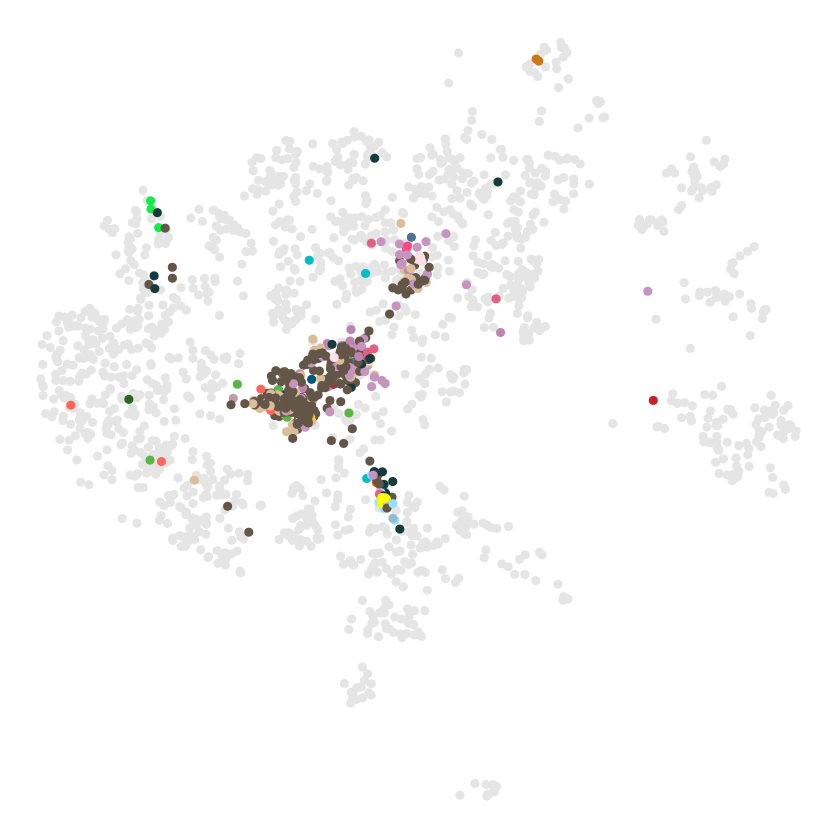

In [67]:
ggplot(meta[meta$stage == 'E9.5' & meta$closest.cell_mnn=='cell_13206', ], aes(UMAP1, UMAP2, col=celltype.mapped_mnn)) +
    geom_point(data=meta[sample(nrow(meta), nrow(meta)/10),], aes(UMAP1, UMAP2), col='gray90') +
    geom_point() + 
    xlim(min(meta$UMAP1), max(meta$UMAP1)) +
    ylim(min(meta$UMAP2), max(meta$UMAP2)) + 
    scale_color_manual(values=opts$celltype.colors) +
    theme_void() + theme(legend.position='none')

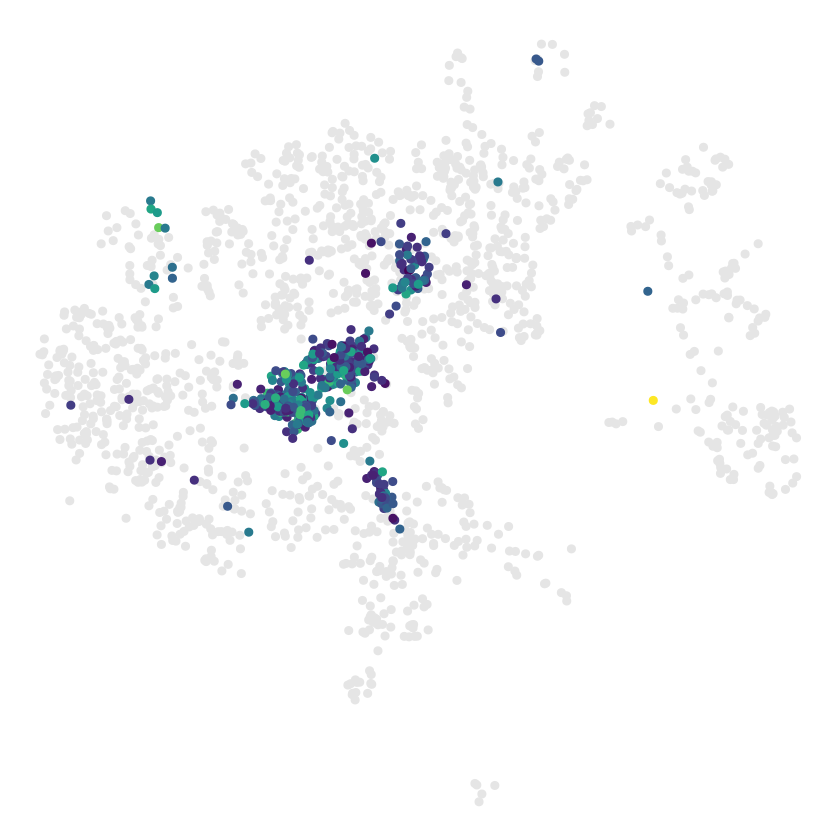

In [68]:
library(viridis)
ggplot(meta[meta$stage == 'E9.5' & meta$closest.cell_mnn=='cell_13206', ], aes(UMAP1, UMAP2, col=celltype.score_mnn)) +
    geom_point(data=meta[sample(nrow(meta), nrow(meta)/10),], aes(UMAP1, UMAP2), col='gray90') +
    geom_point() + 
    xlim(min(meta$UMAP1), max(meta$UMAP1)) +
    ylim(min(meta$UMAP2), max(meta$UMAP2)) + 
    scale_color_viridis() +
    theme_void() + theme(legend.position='none')

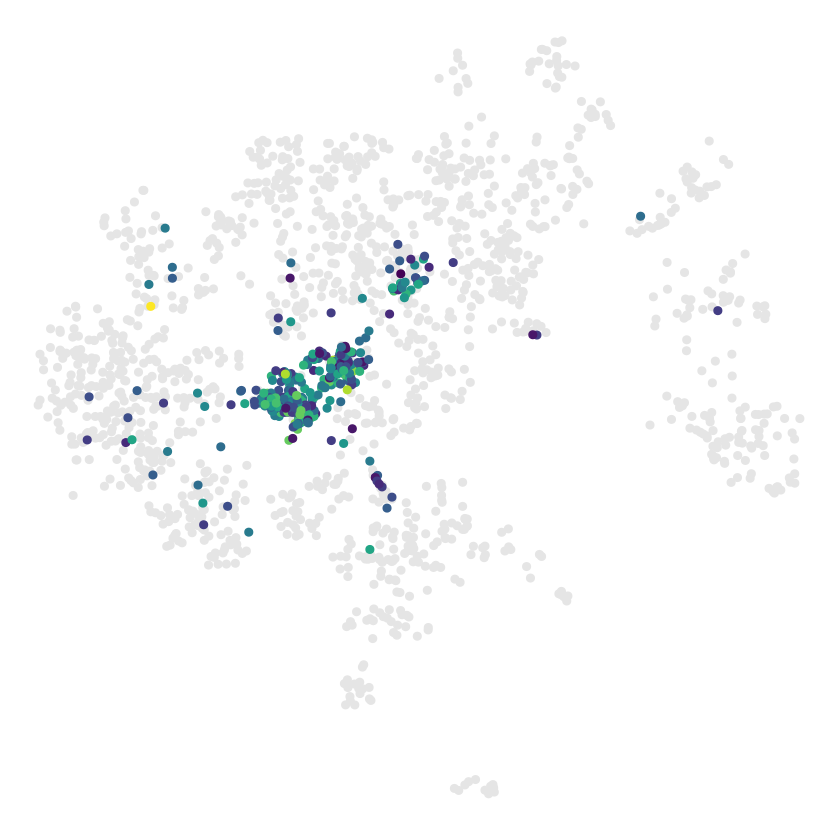

In [69]:
ggplot(meta[meta$stage == 'E9.5' & meta$celltype.mapped_mnn=='Epiblast', ], aes(UMAP1, UMAP2, col=celltype.score_mnn)) +
    geom_point(data=meta[sample(nrow(meta), nrow(meta)/10),], aes(UMAP1, UMAP2), col='gray90') +
    geom_point() + 
    xlim(min(meta$UMAP1), max(meta$UMAP1)) +
    ylim(min(meta$UMAP2), max(meta$UMAP2)) + 
    scale_color_viridis() +
    theme_void() + theme(legend.position='none')

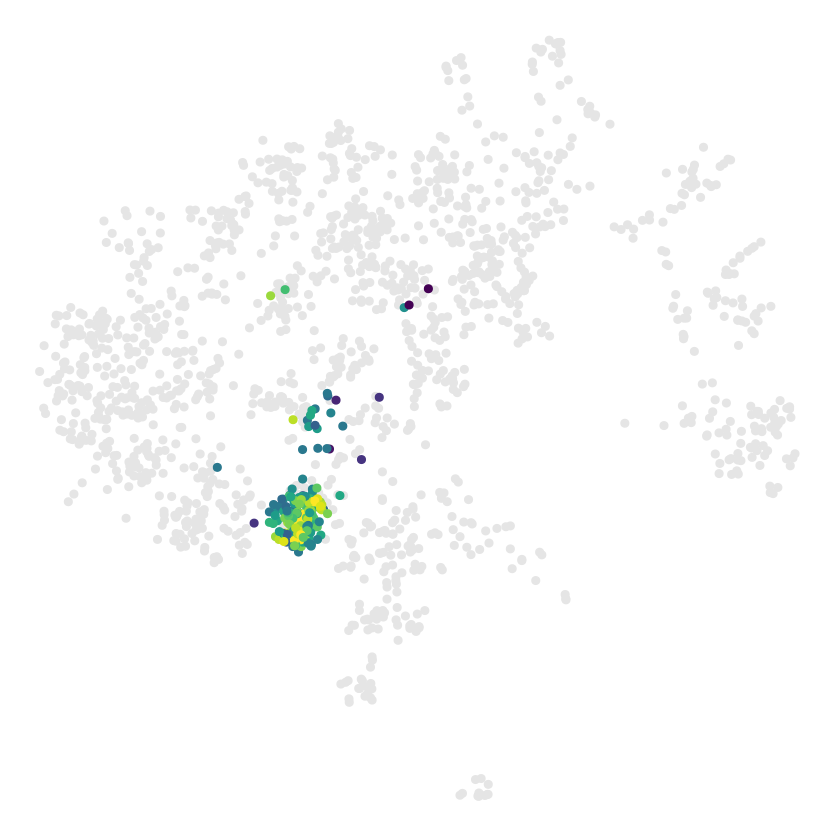

In [72]:
ggplot(meta[meta$stage == 'E7.5' & meta$celltype.mapped_mnn=='Epiblast', ], aes(UMAP1, UMAP2, col=celltype.score_mnn)) +
    geom_point(data=meta[sample(nrow(meta), nrow(meta)/10),], aes(UMAP1, UMAP2), col='gray90') +
    geom_point() + 
    xlim(min(meta$UMAP1), max(meta$UMAP1)) +
    ylim(min(meta$UMAP2), max(meta$UMAP2)) + 
    scale_color_viridis() +
    theme_void() + theme(legend.position='none')

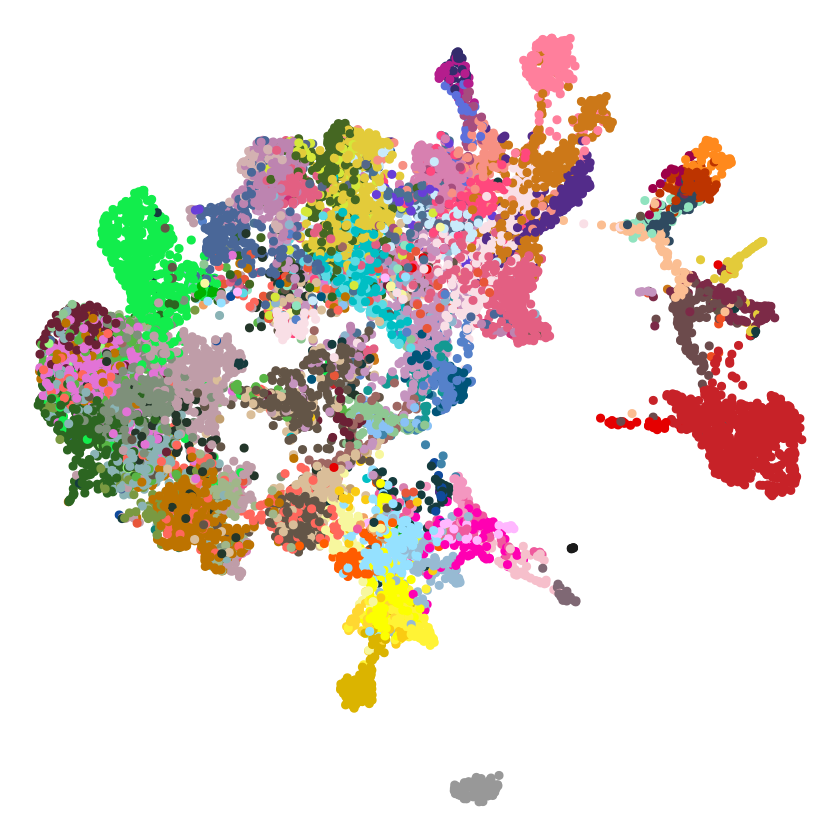

In [73]:
ggplot(meta, aes(UMAP1, UMAP2, col=celltype.mapped_mnn)) +
    geom_point() + 
    xlim(min(meta$UMAP1), max(meta$UMAP1)) +
    ylim(min(meta$UMAP2), max(meta$UMAP2)) + 
    scale_color_manual(values=opts$celltype.colors) +
    theme_void() + theme(legend.position='none')

In [340]:
to.plot = data.table(umap1 = reducedDim(Milo_sce, 'umap_atlas')[,1],
                    umap2 = reducedDim(Milo_sce, 'umap_atlas')[,2], 
                     tdTom = colData(Milo_sce)$tdTom_corr,
                     celltype = colData(Milo_sce)$celltype.mapped_mnn)

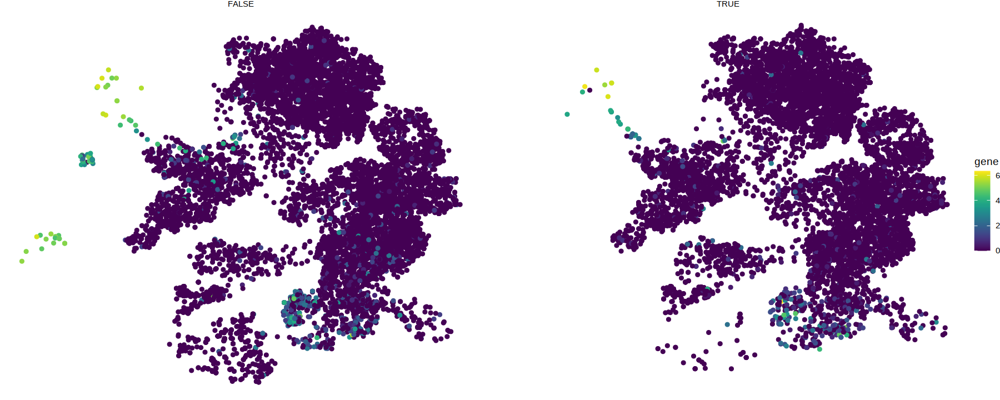

In [341]:
gene = 'Rhox5'
to.plot$gene = as.vector(logcounts(Milo_sce[gene,]))
ggplot(to.plot, #[celltype!='Erythroid'], 
       aes(umap1, umap2, col=gene)) + 
    geom_point() +
    facet_wrap(~tdTom) + 
    scale_color_viridis() +
    theme_void()